# 0. Import Libraries

In [1]:
#import libraries
import numpy as np
import pandas as pd
from pandas import concat
from pandas import DataFrame
from pandas import Grouper
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import seaborn as sns
import joblib
#import snscrape.modules.twitter as sntwitter
import sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import DictVectorizer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import scikitplot as skplt
from scipy import stats
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from joblib import Memory
import advertools as adv
import datetime as dt
from datetime import datetime
import tqdm
from tqdm import tqdm_notebook
import re
import emoji
import spacy
from collections import defaultdict
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.corpus.reader.wordnet import NOUN
from nltk.corpus import wordnet
from wordcloud import WordCloud
import string
import yfinance as yf
from scipy import stats
from hampel import hampel
import pickle
import statsmodels.api as sm
from statsmodels.tsa.stattools import grangercausalitytests

#from alpha_vantage.timeseries import TimeSeries
API_key = 'EB02VJ4ICNHRGLL1'
# finding the state based on geotags
#from geopy.geocoders import Nominatim
#import geopandas as gpd
#import geopy
#from geopy.geocoders import Nominatim
#from geopy.extra.rate_limiter import RateLimiter

# the Geonamescache library contains information
# about continents, cities and US states
import geonamescache

plt.style.use('fivethirtyeight')

sns.set(font_scale=1.5)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
pd.set_option('display.max_colwidth', 100)

# 1. Functions

## 1.1. Twitter Data Collection Functions

In [2]:
def get_tweets(maxTweets, key_word, since, until):    
    '''function that extracts the attributes from the tweets'''
    
    generator = get_generator(key_word, since, until)    
    
    tweets_list = []
    
    # for loop selecting all the atributes from the tweets
    for i,tweet in enumerate(generator):
        if i>maxTweets:
            break
        tweets_list.append([tweet.url, tweet.date, tweet.id, tweet.user.username, tweet.content, tweet.user.verified, tweet.user.location, tweet.lang, tweet.retweetedTweet, tweet.replyCount, tweet.likeCount, tweet.quoteCount, tweet.user.followersCount, tweet.source])
        
    #create the dataframe
    tweets_df = pd.DataFrame(tweets_list, columns=['url', 'date', 'tweet_id', 'username', 'Content', 'verified_status', 'location', 'language', 'retweeted_tweet', 'reply_count', 'like_count', 'quote_count', 'number_followers', 'source'])
    
    return tweets_df

In [3]:
def get_generator(key_word, since, until):
    '''select tweets from a specific topic in a select data frame'''
    '''since/until format type YYYY-MM-DD'''
    query = f'{key_word} since:{since} until:{until}'
    generator = sntwitter.TwitterSearchScraper(query).get_items()
    return generator


## 1.2. Cleaning the Twitter Dataset

In [4]:
#function that cleans url feature
def url_clean(url):
    '''clean the URL feature, select the username and id'''
    pattern = re.compile(r'[^/:]+')
    return re.findall(pattern, url)[2:5:2]


In [5]:
#function that cleans the verified status column
def verified_status(verified):
    '''clean the verified status feature, creating jut boolean variables'''
    if verified == False or verified == 'False':
        return False
    else:
        return True
    

In [6]:
#function that cleans source feature
def source_clean(source):
    '''clean the source feature, select the twitter source'''
    try:
        pattern = re.compile(r'[^/:<>]+')
        return re.findall(pattern, source)[-2]
    except:
        return np.nan

In [7]:
def get_states(longs, latts):
    ''' Function that cross reference coordinates and returns the state to which them belong '''
    # a list of states
    states = []
    # use a coordinate tool from the geopy library
    geolocator = Nominatim(user_agent= 'Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/89.0.4389.128 Safari/537.36', timeout=10)
    for lon, lat in zip(longs, latts):
        try:
            # get the state name
            location = geolocator.reverse(str(lat)+', '+str(lon))
            state = location.raw['address']['state']
        except:
            # return empty string
            state = ''
        states.append(state)
    return states

In [8]:
#function that returns only word characters
def location_characters(location):
    '''clean the source feature, select the tweeter source'''
    try:
        pattern = re.compile(r'[\w]+')
        return " ".join(loc.lower() for loc in re.findall(pattern, location))
    except:
        return np.nan
    

In [9]:
#create a new column just for emojis
def emoji_list(text):
    '''function that extracts the emojis from the Content column'''
    emojis = adv.extract_emoji(text)['emoji_flat']
    x = " ". join(emo for emo in emojis)
    if len(x) == 0:
        return np.nan
    else:
        return x
    

In [10]:
#create a column just for references
def extract_ref(text):
    '''function that extracts the references from the 'content' column'''
    words = text.split()
    for word in words:
        if'@' in word[0]:
            return " ".join([word for word in words if'@' in word[0]])
        else:
            return np.nan
        

In [11]:
#create a column just for hastags
def extract_hastags(text):
    '''function that extracts the hashtag from the 'content' column'''
    words = text.split()
    for word in words:
        if'#' in word[0]:
            return " ".join([word for word in words if'#' in word[0]])
        else:
            return np.nan
        

## 1.3. EDA

In [12]:
def clean_text(text):
    '''function that will remove all mentions, hastangs and links'''
#     #remove emojis
#     text = re.sub(emoji.get_emoji_regexp(), r"", text)
    #remove mentions
    text = " ".join(filter(lambda x:x[0]!='@', text.split()))
    #remove hastags
    text = " ".join(filter(lambda x:x[0]!='#', text.split()))
    #remove hipperlinks
    return re.sub(r'http\S+', '', text)


In [13]:
def process_text(documents, pos=False):
    '''cleans sentences from stop words and punctuation and filters by POS tags if given
    returns cleaned sentence and tokenized sentence'''
    nlp = spacy.load('en_core_web_sm')
    
    texts = []
    tokenised_texts = []

    if pos: # pos can either be False or a list of parts of speech
        for document in tqdm.tqdm(nlp.pipe(documents, batch_size=200)):
            assert document.is_parsed
            tokens = [token
                      for token in document 
                      if token.is_stop == False
                      and token.pos_ in pos
                      and token.pos_ != 'PUNCT']
            doc_ = ''
            for token in tokens:
                doc_ += str(token) + ' '
            
            doc_ = doc_.strip()
            texts.append(doc_)
            tokenised_texts.append(tokens)
    
    
    else:    
        for document in tqdm.tqdm(nlp.pipe(documents, batch_size=200)):
            assert document.is_parsed
            tokens = [token
                      for token in document 
                      if token.is_stop == False
                      and token.pos_ != 'PUNCT']
            doc_ = ''
            for token in tokens:
                doc_ += str(token) + ' '
            
            doc_ = doc_.strip()
            texts.append(doc_)
            tokenised_texts.append(tokens)
            
    return texts, tokenised_texts


In [14]:
def lemmatizer(text):
    '''function that applies the lemmatizer method'''
    wn = WordNetLemmatizer()
    text = [wn.lemmatize(word) for word in text.split()]
    return " ".join(text)

    

In [15]:
def porter_stem(text):
    '''function that applies the Porter Stemmer method'''
    ps = nltk.PorterStemmer()
    return " ".join([ps.stem(word) for word in text.split()])


In [16]:
def scorer(parsed):
    """Determines the average objectivity and positive-versus-negative scores 
    for a given sentence"""
   
    obj_scores, pvn_scores = [], []
    for token in parsed:
        try:
            obj_scores.append(sen_dict[token.pos_][token.lemma_]['objectivity'])
            pvn_scores.append(sen_dict[token.pos_][token.lemma_]['pos_vs_neg'])
        except:
            pass
        
    # set default values if no token found
    if not obj_scores:
        obj_scores = [0.5]
    if not pvn_scores:
        pvn_scores = [0.]
        
    return [np.mean(obj_scores), np.mean(pvn_scores)]


In [17]:
def word_cloud_barchart(method, data, column, choice, ngram_n):
    """
    Args:
    data_filtered, pandas.Dataframe, dataset
    column, string, desired column to analyse
    choice, string, whether you would like a barchart of the top 20 words or a wordcloud
    ngram_n, int, determines the ngram

    This returns either a Word cloud or Bar chart of the top 20 words in the desired dataframe column with the chosen ngram range
    """
    stop = stopwords.words('english')
    stop += ['gamestop', 'stop', 'xbox', 'peopl', 'got', 'go', 'ps5', 'gt', 'order']
    
    # import the desired colormap from matplotlib
    cmap = mpl.cm.Reds(np.linspace(0,1,20)) 
    # the darker part of the matrix is selected for readability
    cmap = mpl.colors.ListedColormap(cmap[-10:,:-1]) 

    
    if method == 'cvec':
        cvec = CountVectorizer(stop_words=stop, lowercase=True,
                       strip_accents="unicode", ngram_range=ngram_n)
        X_all = cvec.fit_transform(data[column])
        columns = cvec.get_feature_names()
        word_counts = np.ravel(X_all.sum(axis=0))
        freq = pd.Series(word_counts, index = columns).sort_values(ascending = False)
        
    elif method == 'tfid':
        tfid = TfidfVectorizer(stop_words=stop, lowercase=True, 
                               strip_accents="unicode", ngram_range=ngram_n)
        X_all = tfid.fit_transform(data[column])
        columns = tfid.get_feature_names()
        word_counts = np.ravel(X_all.sum(axis=0))
        freq = pd.Series(word_counts, index = columns).sort_values(ascending = False)
        

    if choice == 'Word Cloud':
        w = WordCloud(width=1600,height=1200,mode='RGBA',background_color='black',max_words=1000, colormap=cmap).fit_words(freq)
        plt.figure(figsize=(25,25))
        plt.xticks([])
        plt.yticks([])
        plt.imshow(w)
        plt.show()
        
    elif choice == 'Bar Chart':
        freq_20 = freq[:20]
        fig,ax = plt.subplots(figsize=(15,10))
        sns.barplot(freq_20.index, freq_20,ax=ax, edgecolor='black', palette = "rocket")
        ax.tick_params(labelrotation=23)
        ax.set_title(f'Top 20 Highest Rated Stemmed Words({method})')
        ax.set_xlabel('Words', horizontalalignment='right')
        ax.set_ylabel('Word Rating')
        plt.plot()

In [18]:
def sentiment(score):
    if score > 0:
        return 'positive'
    elif score<0:
        return 'negative'
    else:
        return 'neutral'
    

In [19]:
def features_name(method, data, column, ngram_n):
    '''function that return the most mentioned features'''
    
    stop = stopwords.words('english')
    stop += ['gamestop', 'stop']
    
    if method == 'cvec':
        cvec = CountVectorizer(stop_words=stop, lowercase=True,
                       strip_accents="unicode", ngram_range=ngram_n)
        
        #create a sparse matrix
        dtm = cvec.fit_transform(data[column])
        #transform the sparse matrix into a pandas dataframe
        columns_name = cvec.get_feature_names()
        
    elif method == 'tfid':
        tfid = TfidfVectorizer(stop_words=stop, lowercase=True, 
                               strip_accents="unicode", ngram_range=ngram_n)
        #create a sparse matrix
        dtm = tfid.fit_transform(data[column])
        #transform the sparse matrix into a pandas dataframe
        columns_name = tfid.get_feature_names()
        
    #select the top features that appear most
    word_counts = np.ravel(dtm.sum(axis=0))
    freq = pd.Series(word_counts, index = columns_name).sort_values(ascending = False)
    freq_20 = freq[:20]
    freq_20.index
    
    return freq_20.index

In [20]:
def feature_extraction(method, data, column, ngram_n, feature_name):
    '''Function that returns a matrix with the top 10 features'''
    
    stop = stopwords.words('english')
    stop += ['gamestop', 'stop']
    
    
    if method == 'cvec':
        cvec = CountVectorizer(stop_words=stop, lowercase=True,
                       strip_accents="unicode", ngram_range=ngram_n)
        
        dtm = cvec.fit_transform(data[column])
        columns_name = cvec.get_feature_names()
        repr(dtm)
        matrix = pd.DataFrame(dtm.toarray(), columns= columns_name)
    
    elif method == 'tfid':
        tfid = TfidfVectorizer(stop_words=stop, lowercase=True, 
                               strip_accents="unicode", ngram_range=ngram_n)

        dtm = tfid.fit_transform(data[column])
        columns_name = tfid.get_feature_names()
        repr(dtm)
        matrix = pd.DataFrame(dtm.toarray(), columns= columns_name)
        
    return matrix[feature_name]


In [21]:
def autocorr_plots(y, lags=20, alpha=0.05):
    """
    Plot autocorrelations and partial autocorrelations
    Arguments:
    y: Time series
    lags: Number of lags to plot
    alpha: Confidence level for random noise
    """

    se = stats.norm().ppf(1-alpha/2)/np.sqrt(len(y))

    fig, ax = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)

    plot_acf(y, lags=lags, alpha=alpha, ax=ax[0])
    ax[0].hlines(np.array([-1, 1])*se, 1, lags, linestyles='--', lw=1)

    plot_pacf(y, lags=lags, alpha=alpha, ax=ax[1], method='ywmle')
    ax[1].hlines(np.array([-1, 1])*se, 1, lags, linestyles='--', lw=1)

    return fig, ax


# 2. Collecting the Data From Yahoo Finance and Twitter

## 2.1. Collecting Stock Prices

To collect the stock price was initially used Alpha Vantage API, although that was not possible due to the problems running the get_intraday_extended method. So the data was collected from the yahoo finance website for the minimum time interval possible 60 minutes. Note that for smaller intervals, the data was only available two months before the collection.

### Attributes Collected Through Yahoo Finance

In [22]:
yahoo_dict = {"Stock_Features": ["Open", "High", "Low", "Close", "Adj Close", "Volume"], 
                "Description":["Price at which the financial security opens in the specific timeframe when trading begins",
                            "Higher price of a stock in the specific timeframe", 
                            "Lower price of a stock in the specific timeframe",
                            "Price at which the financial security closed in a specific timeframe when trading closes",
                            "Adjusted closing price amends to reflect that stock's value after accounting for any corporate actions",
                            "Volume of shares traded in stock during a specific timeframe"
                              ]}
yahoo_table = pd.DataFrame(yahoo_dict)

In [23]:
yahoo_table

,Stock_Features,Description
0,Open,Price at which the financial security opens in the specific timeframe when trading begins
1,High,Higher price of a stock in the specific timeframe
2,Low,Lower price of a stock in the specific timeframe
3,Close,Price at which the financial security closed in a specific timeframe when trading closes
4,Adj Close,Adjusted closing price amends to reflect that stock's value after accounting for any corporate a...
5,Volume,Volume of shares traded in stock during a specific timeframe


In [24]:
# ts = TimeSeries(key = API_key)
# data, meta = ts.get_intraday_extended('GME', interval='30min', slice='year1month1')


In [98]:
#selecting the ticker to extract the price
tickers = ['GME']
#quering the website to extracted the specified ticker from start and end dates on an interval of 60 minutes
df_GME_price = yf.download(tickers, start="2020-09-01", end="2021-04-01", group_by="ticker", interval = "60m")#, interval = "30m")  
#reset index column name
df_GME_price.index.name = None
#check the head
df_GME_price.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
2020-09-01 09:30:00-04:00,7.3000,7.49,6.77,7.165,7.165,6195127
2020-09-01 10:30:00-04:00,7.1650,7.62,7.14,7.245,7.245,4164376
2020-09-01 11:30:00-04:00,7.2400,7.44,7.02,7.430,7.430,1968057
2020-09-01 12:30:00-04:00,7.4278,7.70,7.37,7.490,7.490,3054700
2020-09-01 13:30:00-04:00,7.4900,7.56,7.32,7.465,7.465,2021132


## 2.2. Collecting Data from Twitter

The code below will scrape up to 3000000 tweets between September 1st, 2020 and April 1st, 2021. The search will be based on the word 'GameStop'. The data was then be saved on a CSV file. The features collected are below.


### Attributes Collected Through snscrape Tweet Object

In [26]:
twitter_dict = {"Twitter_Features": ["url", "date", "tweet_id", "username", "content", "verified_status", "location", 
                             "language", "retweeted_tweet", "reply_count", "like_count", "quote_count", 
                             "number_follower", "source"], "Description":["Permalink pointing to tweet location",
                            "Tweet created date", "Tweet Id", "Also known as your handle, is unique to the account",
                            "Text content of the tweet", "If verified, guarantee that the account is of public interest, authentic, notable, and active",
                            "Location selected by the user", "Language selected by the user", "number of times that a tweet was re-posted",
                            "Number of times that a tweet received a replied", "number of likes that tweet received",
                            "Number of times a tweet was quoted or replied", "Total number of followers that a user has",
                            "ex.iPhone, Android, etc"]}
twitter_table = pd.DataFrame(twitter_dict)


In [71]:
twitter_table

,Twitter_Features,Description
0,url,Permalink pointing to tweet location
1,date,Tweet created date
2,tweet_id,Tweet Id
3,username,"Also known as your handle, is unique to the account"
4,content,Text content of the tweet
5,verified_status,"If verified, guarantee that the account is of public interest, authentic, notable, and active"
6,location,Location selected by the user
7,language,Language selected by the user
8,retweeted_tweet,number of times that a tweet was re-posted
9,reply_count,Number of times that a tweet received a replied


The tweets were obtained with the function created above, "get_tweets", and saved into a CSV file.

In [28]:
#tweets_df = get_tweets(300000, 'GameStop', '2020-09-01', '2021-04-01')



In [29]:
#tweets_df.to_csv("Twitter_GME.csv", index = False)


# 3. Data Cleaning and Data Munging

## 3.1 Stock Price

There are no null values for the stock price and no inconsistencies with the data.
    

In [30]:
#check the data type and null values
df_GME_price.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1016 entries, 2020-09-01 09:30:00-04:00 to 2021-03-31 15:30:00-04:00
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1016 non-null   float64
 1   High       1016 non-null   float64
 2   Low        1016 non-null   float64
 3   Close      1016 non-null   float64
 4   Adj Close  1016 non-null   float64
 5   Volume     1016 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 55.6 KB


In [31]:
#check descriptive statistics
df_GME_price.describe()


,Open,High,Low,Close,Adj Close,Volume
count,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1.016000e+03
mean,57.403937,60.737276,54.207015,57.121775,57.121775,3.540824e+06
std,78.094156,83.961475,72.304501,77.367473,77.367473,6.005960e+06
min,6.060000,6.115000,5.870000,6.055000,6.055000,0.000000e+00
25%,11.667500,11.840000,11.463750,11.677400,11.677400,7.294420e+05
50%,16.227500,16.429950,15.965000,16.214450,16.214450,1.368994e+06
75%,59.094051,61.657499,54.650000,59.245999,59.245999,3.418541e+06
max,397.859985,483.000000,320.000000,396.505005,396.505005,6.069506e+07


## 3.2 Twitter

### 3.2.1 Load and Inspect the Dataset

In [32]:
#Load the dataframe
df = pd.read_csv('/Users/anasfmatias/Documents/github/Capstone_Project/Twitter_GME.csv')


/Users/anasfmatias/opt/anaconda3/envs/fproject/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (2,5,9) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [33]:
#check the initial lines
df.head(2)


,url,datetime,id,username,content,verified_status,location,language,retweeted_tweet,reply_count,like_count,quote_count,number_followers,source
0,https://twitter.com/OswaldoAzuaje8/status/1377410234797408258,2021-03-31 23:59:25+00:00,1377410234797408258,OswaldoAzuaje8,@MileyCyrus @CashApp $joseazuaje Tesla or GameStop,False,"Miramar, FL",ro,NaN,0,0.0,0.0,42.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
1,https://twitter.com/Bag__God/status/1377410187619835906,2021-03-31 23:59:14+00:00,1377410187619835906,Bag__God,@MileyCyrus $BagMob #Gamestop,False,"Chicago, IL",en,NaN,0,0.0,0.0,438.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"


In [34]:
#check initial shape
df.shape


(1434034, 14)

### 3.2.2 Remove Duplicates

Due to the size of the dataset and the required time to process all the duplicate values, the final result was saved on a CSV file to avoid repeating the same step.

In [35]:
#drop duplicate values in the dataframe
# df_d = df.drop_duplicates()

#save the new dataframe into a csv file
# df_d = df_d.to_csv("df_drop.csv", index = False)


In [36]:
#upload the new csv file without the duplicated values
df = pd.read_csv('/Users/anasfmatias/Documents/github/Capstone_Project/df_drop.csv')


/Users/anasfmatias/opt/anaconda3/envs/fproject/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (2,5,9) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [37]:
#check the first rows of the new dataframe
df.head(2)


,url,datetime,id,username,content,verified_status,location,language,retweeted_tweet,reply_count,like_count,quote_count,number_followers,source
0,https://twitter.com/OswaldoAzuaje8/status/1377410234797408258,2021-03-31 23:59:25+00:00,1377410234797408258,OswaldoAzuaje8,@MileyCyrus @CashApp $joseazuaje Tesla or GameStop,False,"Miramar, FL",ro,NaN,0,0.0,0.0,42.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
1,https://twitter.com/Bag__God/status/1377410187619835906,2021-03-31 23:59:14+00:00,1377410187619835906,Bag__God,@MileyCyrus $BagMob #Gamestop,False,"Chicago, IL",en,NaN,0,0.0,0.0,438.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"


In [38]:
#check the first rows of the new dataframe
df.shape


(1434034, 14)

From the observation of the data type, we notice a couple of features that contain the wrong kinds of data. They need to be cleaned and converted to the correct data type.

In [39]:
#check the first rows of the new dataframe
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1434034 entries, 0 to 1434033
Data columns (total 14 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   url               1434032 non-null  object 
 1   datetime          1434031 non-null  object 
 2   id                1434025 non-null  object 
 3   username          1434031 non-null  object 
 4   content           1434023 non-null  object 
 5   verified_status   1434023 non-null  object 
 6   location          968477 non-null   object 
 7   language          1434022 non-null  object 
 8   retweeted_tweet   8 non-null        float64
 9   reply_count       1434021 non-null  object 
 10  like_count        1434013 non-null  float64
 11  quote_count       1434013 non-null  float64
 12  number_followers  1434013 non-null  float64
 13  source            1430340 non-null  object 
dtypes: float64(4), object(10)
memory usage: 153.2+ MB


In [40]:
#check some statistics
df.describe()


,retweeted_tweet,like_count,quote_count,number_followers
count,8.000000,1.434013e+06,1.434013e+06,1.434013e+06
mean,4194.625000,1.815917e+01,3.600888e-01,4.100884e+04
std,4375.943423,1.445125e+03,2.098545e+01,7.430595e+05
min,23.000000,0.000000e+00,0.000000e+00,0.000000e+00
25%,357.250000,0.000000e+00,0.000000e+00,5.600000e+01
50%,3225.000000,0.000000e+00,0.000000e+00,2.660000e+02
75%,7442.500000,2.000000e+00,0.000000e+00,1.150000e+03
max,9997.000000,9.529580e+05,1.041700e+04,6.126468e+07


### 3.2.3 Null values

At least 1% of the information is missing from all the columns. The first step will be to drop the rows with the null values on the columns with less information missing 'url', 'datetime', 'username', 'id', 'content'. Retweeted tweet column will be dropped because it only contains null values.

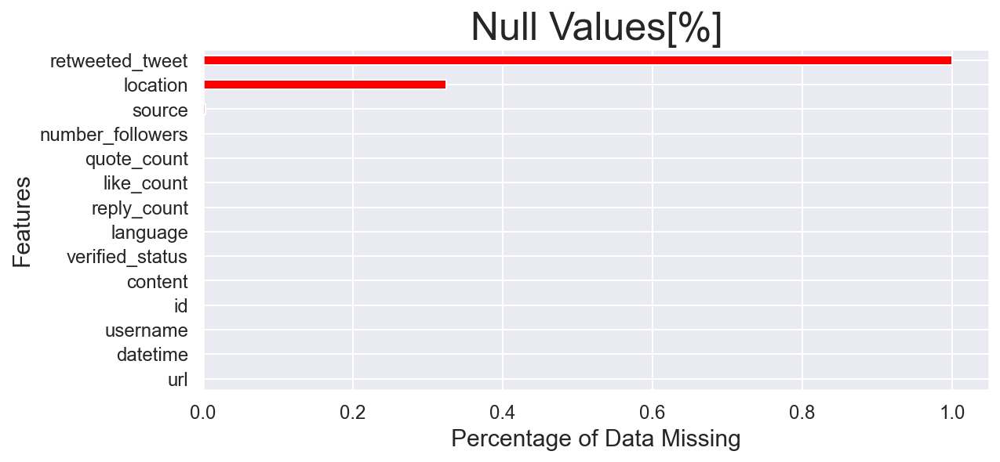

In [41]:
#check the number of null values to see if any features can be eliminated
fig, ax = plt.subplots(figsize=(8, 4))
missing = df.isnull().sum()/df.shape[0]
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot.barh(color ='red', width = 0.4, fontsize = 12) ;
plt.ylabel("Features", fontsize = 15)
plt.xlabel("Percentage of Data Missing", fontsize = 15)
plt.title("Null Values[%]", fontsize = 25)
plt.show()
fig.savefig('Null values.png', bbox_inches='tight')


In [42]:
#drop all the rows with around where the features only have around 1% of the info missing
df = df.dropna( how='any', subset=['url', 'datetime', 'username', 'id', 'content', 'language'])


In [43]:
#check the new shape
df.shape


(1434013, 14)

There are still three features Location, Retweeted Tweet and Source with null values. Retweeted Tweet has 100% null values, so it doesn't make sense to keep it as a feature.

In [44]:
#check the reamining null values
df.isnull().sum()


url                       0
datetime                  0
id                        0
username                  0
content                   0
verified_status           0
location             465546
language                  0
retweeted_tweet     1434013
reply_count               0
like_count                0
quote_count               0
number_followers          0
source                 3673
dtype: int64

In [45]:
#drop Retweeted Tweet
df = df.drop(columns = "retweeted_tweet")


### 3.2.4 Set Datetime as index

We want to observe the evolution of the phenomenon in time, and it's important to have the information organized by date and have the date fixed as the index. 

In [46]:
#transform datetime column in a datetime object
df['datetime'] = pd.to_datetime(df['datetime'])

#sort values by Datetime
df = df.sort_values('datetime')

#transform datetime column in a datetime object
df.set_index('datetime', inplace = True, drop = True)

#reset index column name
df.index.name = None


In [47]:
df.head(2)


,url,id,username,content,verified_status,location,language,reply_count,like_count,quote_count,number_followers,source
2020-09-01 00:00:02+00:00,https://twitter.com/Milton_Thornton/status/1300584162362101762,1300584162362101760.0,Milton_Thornton,@DerekKemper @scarlet_nexus @BandaiNamcoUS GameStop,False,"Chicago, IL",en,0,1.0,0.0,74.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
2020-09-01 00:02:26+00:00,https://twitter.com/jefbiz/status/1300584764815093761,1300584764815093760.0,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,Dudley Ma.,en,0,1.0,0.0,113.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"


### 3.2.5 Cleaning Features

#### Url
Url stores information about the user Id and User name. Let's confirm.

In [48]:
#have a look at the url
print("Url:", df['url'][0])

#comparing with User name and User Id
print("Username:", df['username'][0])
print("User Id:", df['id'][0])

Url: https://twitter.com/Milton_Thornton/status/1300584162362101762
Username: Milton_Thornton
User Id: 1.3005841623621018e+18


In [49]:
#apply url cleanning to all column
df.url = df.url.apply(url_clean)


In [50]:
#check the head of the dataframe
df.head(2)


,url,id,username,content,verified_status,location,language,reply_count,like_count,quote_count,number_followers,source
2020-09-01 00:00:02+00:00,"[Milton_Thornton, 1300584162362101762]",1300584162362101760.0,Milton_Thornton,@DerekKemper @scarlet_nexus @BandaiNamcoUS GameStop,False,"Chicago, IL",en,0,1.0,0.0,74.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
2020-09-01 00:02:26+00:00,"[jefbiz, 1300584764815093761]",1300584764815093760.0,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,Dudley Ma.,en,0,1.0,0.0,113.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"


#### Username
Username is a unique feature that identifies the user. It's possible to understand the number of different users who tweeted about 'GameStop by checking the number of unique values stored in the username feature.

In [51]:
#check unique values for Usernames
df['username'].unique()


array(['Milton_Thornton', 'jefbiz', 'BaldOldHead', ..., 'CJSpaz0384',
       'Bag__God', 'OswaldoAzuaje8'], dtype=object)

In [52]:
#total number of different users
df['username'].nunique()


738775

#### Verified Status
Unique values for "verified_status" should be boolean values, just True and False. The unique method returned five different values, boolean True and False, strings 'True' and 'False' and nan.

In [53]:
#check the verified status
df["verified_status"].unique()


array(['False', 'True', False, True], dtype=object)

In [54]:
#apply verified status to all column
df["verified_status"] = df["verified_status"].apply(verified_status)


In [55]:
#check the head of the dataframe 
df.head(2)


,url,id,username,content,verified_status,location,language,reply_count,like_count,quote_count,number_followers,source
2020-09-01 00:00:02+00:00,"[Milton_Thornton, 1300584162362101762]",1300584162362101760.0,Milton_Thornton,@DerekKemper @scarlet_nexus @BandaiNamcoUS GameStop,False,"Chicago, IL",en,0,1.0,0.0,74.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
2020-09-01 00:02:26+00:00,"[jefbiz, 1300584764815093761]",1300584764815093760.0,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,Dudley Ma.,en,0,1.0,0.0,113.0,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"


#### Location

There are many different locations, some are just abbreviations, and others are not real. For that reason cleaning the location feature is processed that needs to be performed step by step. Like the majority number of cities are from the US, I will start to clean US states. For that, it's required data that match cities with different States.

In [56]:
#check the number of different locations
unique_locations = df.location.unique()
len(unique_locations)


165415

In [ ]:
#generating list of US cities, US longitude and latitude coordinates with geonamescache
# gc = geonamescache.GeonamesCache()
# c = gc.get_cities()

# # extract the US city names and coordinates
# US_cities = [c[key]['name'] for key in list(c.keys())
#              if c[key]['countrycode'] == 'US']
# US_longs = [c[key]['longitude'] for key in list(c.keys())
#             if c[key]['countrycode'] == 'US']
# US_latts = [c[key]['latitude'] for key in list(c.keys())
#             if c[key]['countrycode'] == 'US']


In [ ]:
# find the states of each city
#US_states = get_states(US_longs, US_latts)

In [ ]:
# create a dictionary linking cities as keys with their states
# city_to_state = {}
# for city, state in zip(US_cities, US_states):
#     if state:
#         city_to_state[city] = state


In [ ]:
#create a dataframe for city and corresponding states
# df_city_to_state = pd.DataFrame({'city':city_to_state.keys(),'state':city_to_state.values()})


In [ ]:
#storing city state data into a csv file
# df_city_to_state.to_csv("df_city_state.csv", index = False)


In [57]:
#upload the data frame
df_city_state = pd.read_csv('/Users/anasfmatias/Documents/github/Capstone_Project/df_city_state.csv')
df_city_state.head(2)


,city,state
0,Fort Hunt,Virginia
1,Bessemer,Alabama


In [58]:
df['location'] = df.location.apply(location_characters)


#### Language
Around 60 different languages were used to tweet about GameStop. For now, we will keep all of them. More upfront, I will focus only on English tweets.

In [59]:
#check unique values for languages
df['language'].nunique()


57

In [60]:
#check the different number of languages were used to tweet
df['language'].unique()


array(['en', 'es', 'und', 'it', 'de', 'pt', 'fr', 'et', 'tl', 'ja', 'da',
       'ru', 'in', 'cy', 'nl', 'ta', 'sl', 'no', 'ht', 'zh', 'tr', 'ar',
       'pl', 'hu', 'ca', 'sv', 'ko', 'ro', 'lv', 'eu', 'cs', 'el', 'fa',
       'lt', 'is', 'fi', 'ur', 'hi', 'vi', 'ckb', 'th', 'uk', 'am', 'ne',
       'hy', 'iw', 'pa', 'bg', 'ka', 'sr', 'mr', 'ml', 'si', 'te', 'gu',
       'bn', 'or'], dtype=object)

#### Reply Count
The "reply_count" has a data type that indicates that some wrong data types are in between the data. It needs to be transformed into float numbers.

In [61]:
#check the different numbers os replies
df["reply_count"].nunique()


910

In [62]:
#trans forme reply count into a float variable
df["reply_count"] = df["reply_count"].apply(lambda x: np.nan if x == '' else float(x))


#### Like Count


The "like_count" is in the correct format, and it doesn't indicate that it requires any cleaning. An observation of the describe results also don't show any abnormality of the data.

In [63]:
#check the different numbers os replies
df["like_count"].unique()


array([1.000e+00, 0.000e+00, 8.000e+01, ..., 1.227e+03, 2.464e+03,
       1.188e+03])

#### Quote Count

The "quote_count" feature doesn't have null values and has the correct data type. An observation of the describe results also don't indicate any abnormality of the data.


In [64]:
#check the different quote count
df["quote_count"].nunique()


424

#### Number of Followers
The "number_followers" feature doesn't have null values and has the correct data type. An observation of the describe results also don't indicate any abnormality of the data.

In [65]:
#check the different numbers os replies
df["number_followers"].nunique()


44679

#### Source
Information about the source comes in the format "HTTP", so the specific information needs to be extracted.

In [66]:
df.source.unique()[:5]


array(['<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>',
       '<a href="https://mobile.twitter.com" rel="nofollow">Twitter Web App</a>',
       '<a href="http://mvilla.it/fenix" rel="nofollow">Fenix 2</a>',
       '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>',
       '<a href="https://www.streamsocial.gg" rel="nofollow">StreamSocialApp</a>'],
      dtype=object)

In [67]:
df.source = df.source.apply(source_clean)


#### Emojis 
Column that store the extracted emojis from the content column.

In [69]:
#apply the emoji function to the 'Content' column and create a new one
df['emojis'] = df['content'].apply(emoji_list) 


#### References
The column that stores the extracted @references from the content column.

In [72]:
#apply the extract_ref function to the 'Content' column and create a new one
df['references'] = df['content'].apply(extract_ref) 


#### Hashtags
The column that stores the extracted #hashtags'from the content column.

In [73]:
#apply the extract_ref function to the 'Content' column and create a new one
df['hashtags'] = df['content'].apply(extract_hastags) 


In [ ]:
#save the new dataframe into a csv file
#df.to_csv("df_toks.csv", index = True)


In [74]:
#upload the new csv file without the duplicated values
df_f = pd.read_csv('/Users/anasfmatias/Documents/github/Capstone_Project/df_toks.csv')
df_f.head(2)


,Unnamed: 0,url,id,username,content,verified_status,location,language,reply_count,like_count,quote_count,number_followers,source,emojis,references,hashtags
0,2020-09-01 00:00:02+00:00,"['Milton_Thornton', '1300584162362101762']",1.300584e+18,Milton_Thornton,@DerekKemper @scarlet_nexus @BandaiNamcoUS GameStop,False,chicago il,en,0.0,1.0,0.0,74.0,Twitter for iPhone,NaN,@DerekKemper @scarlet_nexus @BandaiNamcoUS,NaN
1,2020-09-01 00:02:26+00:00,"['jefbiz', '1300584764815093761']",1.300585e+18,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,dudley ma,en,0.0,1.0,0.0,113.0,Twitter for iPhone,NaN,NaN,NaN


In [75]:
#transform datetime column in a datetime object
df_f['Unnamed: 0'] = pd.to_datetime(df_f['Unnamed: 0'])

#transform date column in index column
df_f.set_index('Unnamed: 0', inplace = True, drop = True)

# #reset index column name
df_f.index.name = None
df_f.head(2)


,url,id,username,content,verified_status,location,language,reply_count,like_count,quote_count,number_followers,source,emojis,references,hashtags
2020-09-01 00:00:02+00:00,"['Milton_Thornton', '1300584162362101762']",1.300584e+18,Milton_Thornton,@DerekKemper @scarlet_nexus @BandaiNamcoUS GameStop,False,chicago il,en,0.0,1.0,0.0,74.0,Twitter for iPhone,NaN,@DerekKemper @scarlet_nexus @BandaiNamcoUS,NaN
2020-09-01 00:02:26+00:00,"['jefbiz', '1300584764815093761']",1.300585e+18,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,dudley ma,en,0.0,1.0,0.0,113.0,Twitter for iPhone,NaN,NaN,NaN


In [ ]:
# df_em.drop(columns = 'Unnamed: 0', inplace = True)
# df_em.head(2)


# 4. EDA

## 4.1  Stock Price Exploratory Data Analyse

### 4.1.1 Creating a Boxplot and Checking for Outliers


In [100]:
#check if the index is in the correct format
type(df_GME_price.index) == pd.core.indexes.datetimes.DatetimeIndex 


True

In [101]:
#create a new variable that specifies if the price went up or dow 0 for down and 1 for up
up_down = []
for i in range(df_GME_price.shape[0]):
    if df_GME_price['Open'][i] > df_GME_price['Close'][i]:
        up_down.append(0)
    else:
        up_down.append(1)
df_GME_price['up_down'] = up_down


In [102]:
scaler = StandardScaler()
df_GME_scl = pd.DataFrame(scaler.fit_transform(df_GME_price), columns = df_GME_price.columns, index = df_GME_price.index )
df_GME_scl

,Open,High,Low,Close,Adj Close,Volume,up_down
2020-09-01 09:30:00-04:00,-0.641900,-0.634499,-0.656396,-0.646026,-0.646026,0.442163,-0.953821
2020-09-01 10:30:00-04:00,-0.643629,-0.632950,-0.651276,-0.644991,-0.644991,0.103873,1.048415
2020-09-01 11:30:00-04:00,-0.642668,-0.635095,-0.652937,-0.642599,-0.642599,-0.261997,1.048415
2020-09-01 12:30:00-04:00,-0.640262,-0.631997,-0.648094,-0.641823,-0.641823,-0.080980,1.048415
2020-09-01 13:30:00-04:00,-0.639466,-0.633665,-0.648785,-0.642146,-0.642146,-0.253155,-0.953821
...,...,...,...,...,...,...,...
2021-03-31 11:30:00-04:00,1.737298,1.625387,1.899198,1.742781,1.742781,-0.427645,-0.953821
2021-03-31 12:30:00-04:00,1.722950,1.612994,1.899752,1.786232,1.786232,-0.496816,1.048415
2021-03-31 13:30:00-04:00,1.765278,1.624434,1.921891,1.790066,1.790066,-0.474548,1.048415
2021-03-31 14:30:00-04:00,1.772528,1.611564,1.877889,1.724806,1.724806,-0.433740,-0.953821


The higher number of outliers is registered on January 21. From the boxplot is possible to observe that the median of the stock price is increasing through the the time.

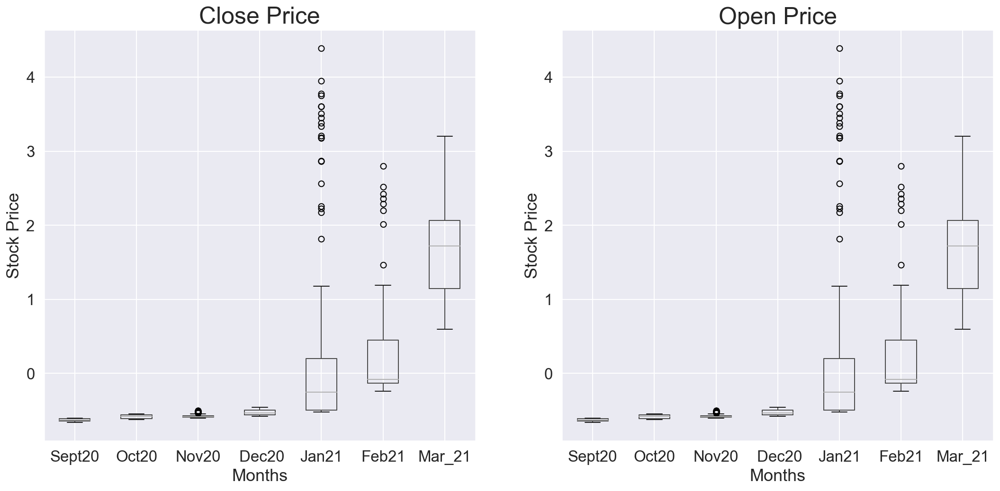

In [79]:
fig, ax = plt.subplots(ncols=2, figsize=(16, 8))
groups_close = df_GME_scl['Close'].groupby(Grouper(freq='M'))
months_close = DataFrame(concat([DataFrame(x[1].values) for x in groups_close], axis=1))
months_close.columns = ['Sept20', 'Oct20', 'Nov20',' Dec20', 'Jan21', 'Feb21', 'Mar_21']
months_close.boxplot(ax = ax[0])
groups_open = df_GME_scl['Open'].groupby(Grouper(freq='M'))
months_open = DataFrame(concat([DataFrame(x[1].values) for x in groups_close], axis=1))
months_open.columns = ['Sept20', 'Oct20', 'Nov20',' Dec20', 'Jan21', 'Feb21', 'Mar_21']
months_open.boxplot(ax = ax[1])
ax[0].set_title('Close Price', fontsize=25)
ax[0].set_xlabel('Months')
ax[0].set_ylabel('Stock Price')
ax[1].set_title('Open Price', fontsize=25)
ax[1].set_xlabel('Months')
ax[1].set_ylabel('Stock Price')
plt.show()
fig.savefig('Open_Close.png', bbox_inches='tight')

The months with more outliers are October 2020, January and February 2021. The volume of transactions had its peak around January, not coincident with the price of the stock price.

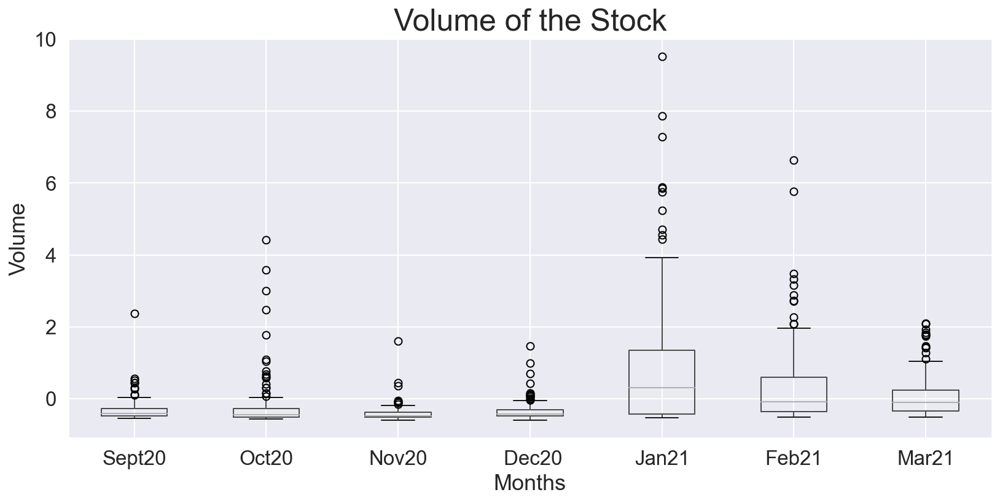

In [80]:
fig, ax = plt.subplots(figsize=(12, 6))
groups = df_GME_scl['Volume'].groupby(Grouper(freq='M'))
months= DataFrame(concat([DataFrame(x[1].values) for x in groups], axis=1))
months.columns = ['Sept20', 'Oct20', 'Nov20',' Dec20', 'Jan21', 'Feb21', 'Mar21']
months.boxplot(ax = ax)
ax.set_title('Volume of the Stock', fontsize=25)
ax.set_xlabel('Months')
ax.set_ylabel('Volume')
plt.show()
fig.savefig('Volume_Stock.png', bbox_inches='tight')

In [ ]:
# #dropping outliers by month
# groups = df_GME_scl['Volume'].groupby(Grouper(freq='M'))
# months_volume= DataFrame(concat([DataFrame(x[1].values) for x in groups], axis=1))
# months_volume.columns = ['Sept20', 'Oct20', 'Nov20',' Dec20', 'Jan21', 'Feb21', 'Mar21']
# months_volume.head()


#### Drop Outliers

Outliers will be dropped with the Hampel filter, generally used to detect anomalies in data with a time-series structure. It consists of a sliding window of a parameterizable size. For each window, each observation will be compared with the Median Absolute Deviation (MAD). The observation will be considered an outlier when it exceeds the MAD by n times (the parameter n is also parameterizable). 

In [81]:
df_GME_price['Open'] = hampel(df_GME_price['Open'], window_size=5, n=3, imputation=True)


In [82]:
df_GME_price['High'] = hampel(df_GME_price['High'], window_size=5, n=3, imputation=True)


In [83]:
df_GME_price['Low'] = hampel(df_GME_price['Low'], window_size=5, n=3, imputation=True)


In [84]:
df_GME_price['Close'] = hampel(df_GME_price['Close'], window_size=5, n=3, imputation=True)


In [85]:
df_GME_price['Adj Close'] = hampel(df_GME_price['Adj Close'], window_size=5, n=3, imputation=True)


In [86]:
df_GME_price['Volume'] = hampel(df_GME_price['Volume'], window_size=5, n=3, imputation=True)


In [87]:
df_GME_price['up_down'] = hampel(df_GME_price['up_down'], window_size=5, n=3, imputation=True)


In [88]:
df_GME_price.head()


,Open,High,Low,Close,Adj Close,Volume,up_down
2020-09-01 09:30:00-04:00,7.3000,7.49,7.33,7.165,7.165,6195127.0,1.0
2020-09-01 10:30:00-04:00,7.1650,7.62,7.14,7.245,7.245,4164376.0,1.0
2020-09-01 11:30:00-04:00,7.2400,7.44,7.02,7.430,7.430,1968057.0,1.0
2020-09-01 12:30:00-04:00,7.4278,7.70,7.37,7.490,7.490,3054700.0,1.0
2020-09-01 13:30:00-04:00,7.4900,7.56,7.32,7.465,7.465,2021132.0,1.0


### 4.1.2 Check Autocorrelation and Partial Correlation

Autocorrelation is simply the correlation of a series with its lags. If a string is significantly autocorrelated, that means the previous values of the series (lags) may help predict the current value.

Partial Autocorrelation also conveys similar information, but it gets the pure correlation of a series and its lag, excluding the correlation contributions from the intermediate lags.

In this case, I used a 7D resample and 14 lags. From the graphics observation, it's clear that it's impossible to predict with accuracy the evaluation of the stock price.

In [89]:
acf(df_GME_price.Close, nlags = 40)


/Users/anasfmatias/opt/anaconda3/envs/fproject/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:667: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(


array([1.        , 0.98079718, 0.97340483, 0.96292288, 0.95224672,
       0.94193853, 0.92697836, 0.91348526, 0.90316333, 0.89662364,
       0.88785461, 0.8767943 , 0.86543078, 0.86135311, 0.84937127,
       0.84023005, 0.82828403, 0.8153155 , 0.80362426, 0.79249894,
       0.78067973, 0.76306829, 0.75152574, 0.73633192, 0.72421951,
       0.70999501, 0.69679952, 0.68304632, 0.67191468, 0.66305979,
       0.65402036, 0.64573709, 0.63887573, 0.63256776, 0.62618805,
       0.62122486, 0.61534524, 0.61008116, 0.6041042 , 0.59823449,
       0.59222958])

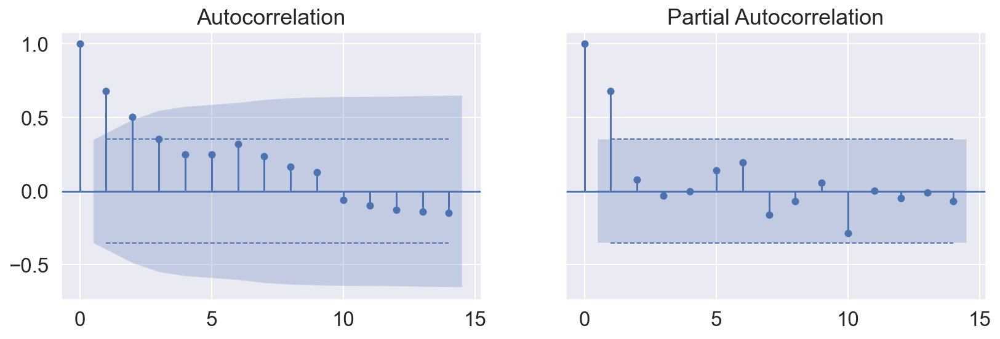

In [90]:
fig, ax = autocorr_plots(df_GME_price.Close.resample('7D').mean(), lags = 14)
fig.savefig('Autocorrelation_Partional.png', bbox_inches='tight')

In [91]:
df_GME_scl.dropna(inplace = True)


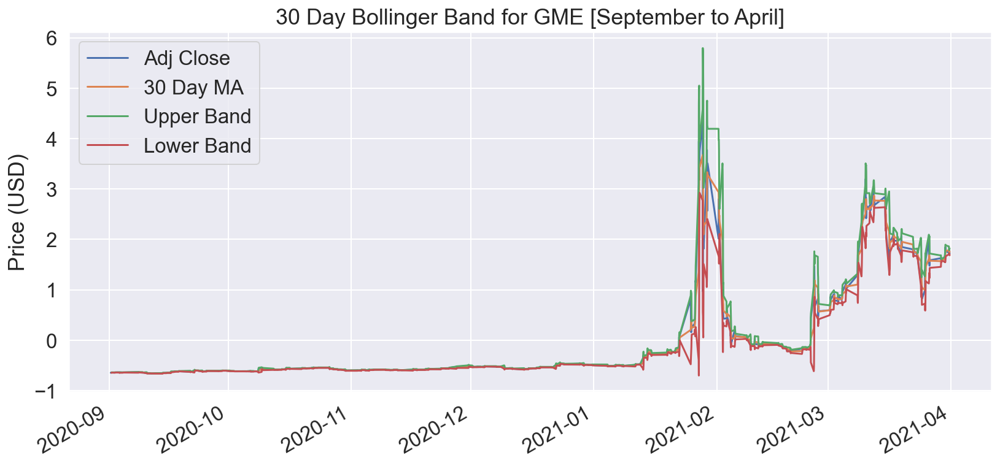

In [92]:
# Calculate 30 Day Moving Average, Std Deviation, Upper Band and Lower Band
df_GME_scl['30 Day MA'] = df_GME_scl['Adj Close'].rolling(window=5).mean()
    
# set .std(ddof=0) for population std instead of sample
df_GME_scl['30 Day STD'] = df_GME_scl['Adj Close'].rolling(window=5).std() 
df_GME_scl['Upper Band'] = df_GME_scl['30 Day MA'] + (df_GME_scl['30 Day STD'] * 2)
df_GME_scl['Lower Band'] = df_GME_scl['30 Day MA'] - (df_GME_scl['30 Day STD'] * 2)

# Simple 30 Day Bollinger Band for Facebook (2016-2017)
df_GME_scl[['Adj Close', '30 Day MA', 'Upper Band', 'Lower Band']].plot(figsize=(12,6))
plt.title('30 Day Bollinger Band for GME [September to April]')
plt.ylabel('Price (USD)')
plt.show();

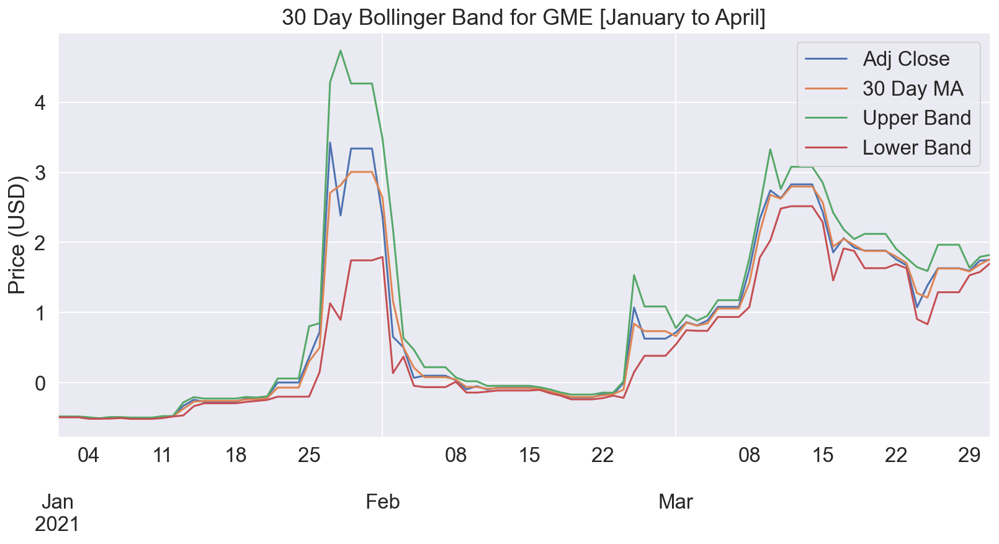

In [93]:
# Calculate 30 Day Moving Average, Std Deviation, Upper Band and Lower Band
df_GME_scl['30 Day MA'] = df_GME_scl['Adj Close'].rolling(window=5).mean()
    
# set .std(ddof=0) for population std instead of sample
df_GME_scl['30 Day STD'] = df_GME_scl['Adj Close'].rolling(window=5).std() 
df_GME_scl['Upper Band'] = df_GME_scl['30 Day MA'] + (df_GME_scl['30 Day STD'] * 2)
df_GME_scl['Lower Band'] = df_GME_scl['30 Day MA'] - (df_GME_scl['30 Day STD'] * 2)
df_GME_graph = df_GME_scl[['Adj Close', '30 Day MA', 'Upper Band', 'Lower Band']].resample('D').mean()
df_GME_graph.ffill(inplace = True)
# Simple 30 Day Bollinger Band for Facebook (2016-2017)
#df_GME_scl.loc['2020-12-31 15:30:00-05:00': ,['Adj Close', '30 Day MA', 'Upper Band', 'Lower Band']].plot(figsize=(12,6))


df_GME_graph.loc['2020-12-31 15:30:00-05:00':, ].plot(figsize=(12,6))
plt.title('30 Day Bollinger Band for GME [January to April]')
plt.ylabel('Price (USD)')
plt.show();

2021-05-19 12:45:37,688 | WARNING | legend.py:1193 | _parse_legend_args | No handles with labels found to put in legend.


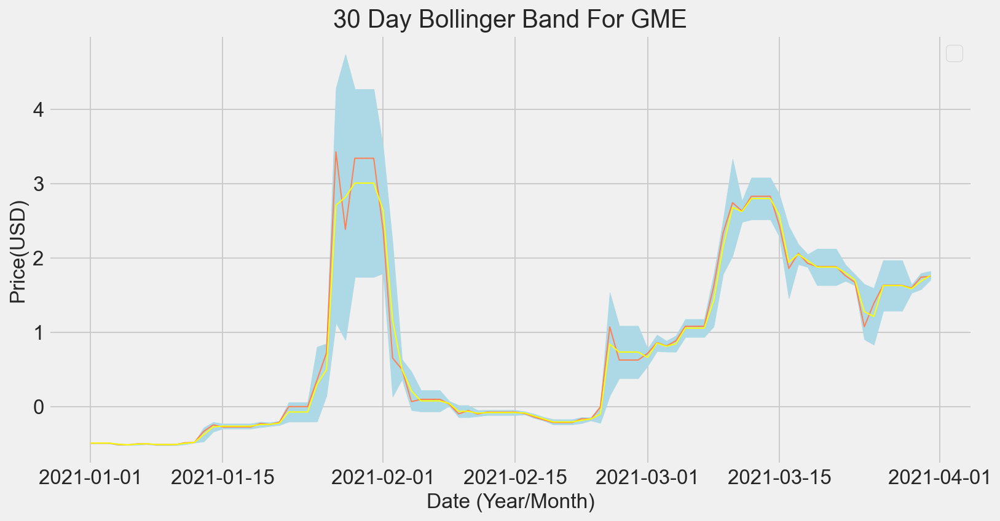

In [94]:
# set style, empty figure and axes
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

# Get index values for the X axis
x_axis =df_GME_graph.loc['2020-12-31 15:30:00-05:00':, ].index.get_level_values(0)

# Plot shaded 21 Day Bollinger Band
ax.fill_between(x_axis, df_GME_graph.loc['2020-12-31 15:30:00-05:00':, 'Upper Band'], df_GME_graph.loc['2020-12-31 15:30:00-05:00':,'Lower Band'], color='lightblue')

# Plot Adjust Closing Price and Moving Averages
ax.plot(x_axis, df_GME_graph.loc['2020-12-31 15:30:00-05:00':,'Adj Close'], color='coral', lw=1)
ax.plot(x_axis, df_GME_graph.loc['2020-12-31 15:30:00-05:00':,'30 Day MA'], color='yellow', lw=1)

# Set Title & Show the Image
ax.set_title('30 Day Bollinger Band For GME')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show();
fig.savefig('30_Day_Bollinger_Band.png', bbox_inches='tight')

### 4.1.3 Correlation Matrix

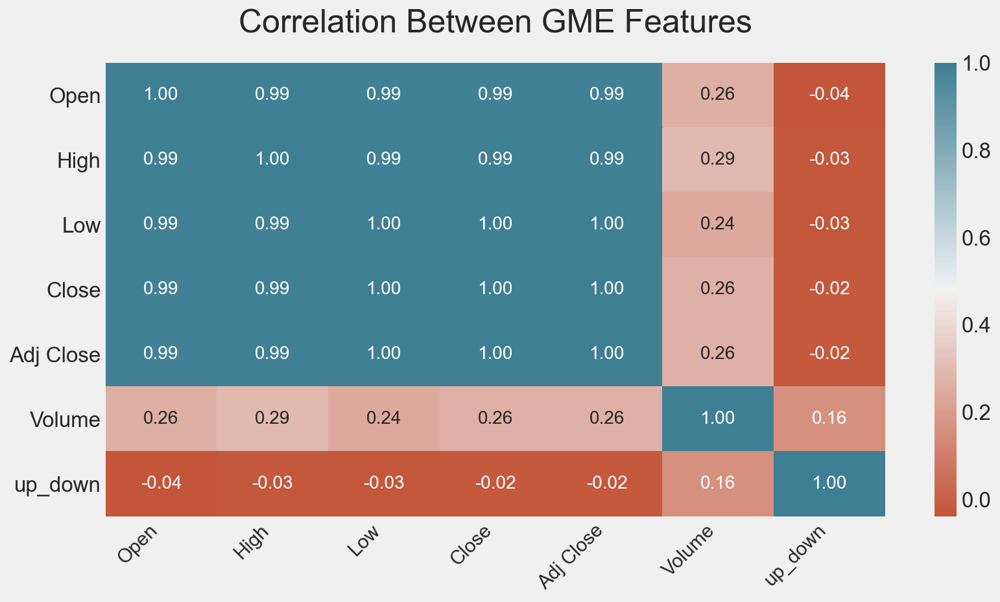

In [95]:
#seaborn heatmap to help around the correlation matrix
fig_heat = plt.figure(figsize=(12, 6))
ax = fig_heat.gca()
sns.heatmap(df_GME_price.corr(), annot=True, fmt='.2f', cmap=sns.diverging_palette(20, 220, n=200))
ax.set_title('Correlation Between GME Features', fontsize=25, y = 1.05)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=15)
plt.show()

## 4.2 Drop Unnecessary Columns
Only tweets done in English were taken into account so that can reduce the size of the dataset. Also, the Location column will be drop, because it contains a large number of null values. The Url column, because it includes repeated information, will also be dropped.

In [96]:
#select only tweets in english language
df_eda = df_f[df_f["language"] == 'en']


In [97]:
df_eda.head(2)


,url,id,username,content,verified_status,location,language,reply_count,like_count,quote_count,number_followers,source,emojis,references,hashtags
2020-09-01 00:00:02+00:00,"['Milton_Thornton', '1300584162362101762']",1.300584e+18,Milton_Thornton,@DerekKemper @scarlet_nexus @BandaiNamcoUS GameStop,False,chicago il,en,0.0,1.0,0.0,74.0,Twitter for iPhone,NaN,@DerekKemper @scarlet_nexus @BandaiNamcoUS,NaN
2020-09-01 00:02:26+00:00,"['jefbiz', '1300584764815093761']",1.300585e+18,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,dudley ma,en,0.0,1.0,0.0,113.0,Twitter for iPhone,NaN,NaN,NaN


In [98]:
#drop Url, Location, Language
df_eda = df_eda.drop(columns = ["url","location", "language"])


## 4.3 Pre-processing Text Data

The 'Content' column was cleaned, removing the hashtags and references. Then I filtered the dataset to remove the tweets with a length inferior to 5 words. This filter is required because fewer words than five are difficult to extract the result from the text.
The remaining text on the 'text column will be clean and prepared for sentiment analyse, using the following process:
* Remove stopwords
* Remove punctuations
* Tokenisation - Converting a sentence into a list of words
* Lemmetization/stemming - Transforming any form of a word to its root word

After cleaning the tweets, the unstructured data will be processed using the SpaCy and Vader package to extract meaningful patterns from the data. The top 10 words will be added as features of the DataFrame, to check the impact of specific words.

In [99]:
#apply the clean_text function to remove '#hastags' and '@references' to the Context column
df_eda['text'] = df_eda['content'].apply(clean_text)


In [100]:
df_eda['text_len'] = df_eda.text.map(lambda x: len(x.split()))
df_eda = df_eda[df_eda.text_len > 5]
df_eda.shape


(1127059, 14)

### 4.3.1 Using Spacy

#### Information Extraction

Text data contains a lot of information, but not all are useful. To extract the most relevant information, I will use the spaCy library since it has all the necessary tools for working with text data and information extraction. Text data are made up of words belonging to different parts of the speech, POS. The POS determines how a specific word functions in meaning in a given sentence. It carries a lot of significance when it comes to an understanding the meaning of a sentence. And we can leverage it to extract meaningful information from our text.

In [103]:
#pos tags used
pos = ['NOUN', 'ADJ', 'VERB', 'ADV', 'SYM', 'PROPN']


In [104]:
processed_text, tokenised_text = process_text(df_eda['text'], pos=pos)


In [105]:
#drop all the rows with around where the features only have around 1% of the info missing
df_eda = df_eda.dropna( how='any', subset=['processed_text'])


In [106]:
df_eda['processed_text'] = processed_text #text
df_eda['tokenised_text'] = tokenised_text #tokenised text


In [107]:
df_eda['lemmatized_text'] = df_eda.processed_text.apply(lemmatizer)
df_eda['stemmer_text'] = df_eda.processed_text.apply(porter_stem)


In [110]:
#drop all the rows with around where the features only have around 1% of the info missing
df_eda = df_eda.dropna( how='any', subset=['lemmatized_text', 'stemmer_text'])

#### Assign sentiment scores
To assign the sentiment score, I will start by calculating the polarity scores of the text showing each word's tendency for expressing positive or negative sentiment. Then we can produce an average score for all the terms contained in a text leading to an overall positive, negative or neutral sentiment score.

I will use a list of words with positivity and negativity scores. The words in the list may form common roots of various words obtained through stemming or lemmatization. Therefore, the list also contains distinctions of how a word is tagged in regard to its sentence functionality. 

In [102]:
#uploady spacy sentiment dictionary
sents = pd.read_csv('/Users/anasfmatias/Desktop/DS/Capstone_19April/word_sentiments.csv')

In [111]:
#create the sen_dict from the word_sentiments data frame
sen_dict = defaultdict(dict) # set up a default dictionary with an empty dictionary as default value

for row in sents.itertuples():
    sen_dict[row.pos] [row.word] = {'objectivity': row.objectivity, 'pos_vs_neg': row.pos_vs_neg}
    

In [112]:
scores = df_eda['tokenised_text'].map(scorer)
df_eda['objectivity_avg_spacy'] = scores.map(lambda x: x[0])
df_eda['polarity_avg_spacy'] = scores.map(lambda x: x[1])

In [113]:
df_eda['sentiment_spacy'] = df_eda.polarity_avg.apply(sentiment)


In [114]:
#save the new dataframe into a csv file
df_eda.to_csv("df_eda_final.csv", index = True)


In [115]:
#upload the new csv file without the duplicated values
df_eda = pd.read_csv('/Users/anasfmatias/Desktop/DS/cap_25_april/df_eda_final.csv')
df_eda.head(2)


,Unnamed: 0,Id,Username,Content,Verified Status,Reply Count,Like Count,Quote Count,Number of Followers,Source,...,hastags,text,text_len,processed_text,tokenised_text,lemmatized_text,stemmer_text,objectivity_avg,polarity_avg,sentiment
0,2020-09-01 00:02:26+00:00,1.300585e+18,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,0.0,1.0,0.0,113.0,Twitter for iPhone,...,NaN,Sell yo house pass GO and spend $300 at Game Stop.,11,Sell yo house pass spend $ Game Stop,"[Sell, yo, house, pass, spend, $, Game, Stop]",Sell yo house pas spend $ Game Stop,sell yo hous pass spend $ game stop,0.930156,0.023594,positive
1,2020-09-01 00:03:27+00:00,1.300585e+18,BaldOldHead,@adinross He did say he has a gamestop plug or something,False,0.0,0.0,0.0,39.0,Twitter for iPhone,...,NaN,He did say he has a gamestop plug or something,10,gamestop plug,"[gamestop, plug]",gamestop plug,gamestop plug,0.982143,0.017857,positive


In [116]:
#transform datetime column in a datetime object
df_eda['Unnamed: 0'] = pd.to_datetime(df_eda['Unnamed: 0'])

#transform date column in index column
df_eda.set_index('Unnamed: 0', inplace = True, drop = True)

# #reset index column name
df_eda.index.name = None
df_eda.head(2)


In [117]:
#drop all the rows with around where the features only have around 1% of the info missing
df_eda = df_eda.dropna( how='any', subset=['lemmatized_text', 'stemmer_text'])


In [120]:
df_eda.drop(columns = ['Unnamed: 0'], inplace = True )


In [121]:
df_eda.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1127059 entries, 0 to 1127058
Data columns (total 21 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   Id                   1127059 non-null  float64
 1   Username             1127059 non-null  object 
 2   Content              1127059 non-null  object 
 3   Verified Status      1127059 non-null  bool   
 4   Reply Count          1127059 non-null  float64
 5   Like Count           1127059 non-null  float64
 6   Quote Count          1127059 non-null  float64
 7   Number of Followers  1127059 non-null  float64
 8   Source               1123941 non-null  object 
 9   emojis               131937 non-null   object 
 10  references           474106 non-null   object 
 11  hastags              17347 non-null    object 
 12  text                 1127059 non-null  object 
 13  text_len             1127059 non-null  int64  
 14  processed_text       1126714 non-null  object 
 15

### 4.3.2 Using Vader
Tweets classification shows that the tool is not performing as well as expected. To try to improve the model, I decided to explore VADER Sentiment Analysis. VADER (Valence Aware Dictionary and Sentiment Reasoner) is a lexicon and rule-based sentiment analysis tool specifically attuned to sentiments expressed in social media. Vader uses a combination of sentiment lexicon, which are generally labelled according to their semantic orientation as either positive or negative. VADER uses punctuation, capitalization, degree modifier, conjunctions, emojis and slangs, so there is no need to clean the text.

In [130]:
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()
dvec = DictVectorizer()


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/anasfmatias/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [131]:
#creates a polarity score dictionary
vader_scores = df_eda['text'].map(sid.polarity_scores)


In [133]:
#scaler the features
vader_scores = dvec.fit_transform(vader_scores)


In [134]:
#check the features names
dvec.feature_names_


['compound', 'neg', 'neu', 'pos']

In [135]:
#create polarity score columns to store the coumpound score and negative, neutral and positive values
for i, col in enumerate(dvec.feature_names_):
    df_eda['vader_{}'.format(col)] = vader_scores[:, i].toarray().ravel()
    

A new column will store the overall sentiment. For compound values greater, I will attribute a positive tag and the ones less than zero negative.

In [136]:
df_eda['vader_sentiment'] = df_eda['vader_compound'].apply(lambda c: 'positive' if c >0 else 'negative' if c <0 else 'neutral')

In [137]:
#save the new dataframe into a csv file
#df_eda.to_csv("df_eda_vader.csv", index = True)


In [22]:
#upload the new csv file without the duplicated values
df_eda = pd.read_csv('/Users/anasfmatias/Documents/github/Capstone_Project/df_eda_vader.csv')
df_eda.head(2)


,Unnamed: 0,Id,Username,Content,Verified Status,Reply Count,Like Count,Quote Count,Number of Followers,Source,...,lemmatized_text,stemmer_text,objectivity_avg,polarity_avg,sentiment,vader_compound,vader_neg,vader_neu,vader_pos,vader_sentiment
0,2020-09-01 00:02:26+00:00,1.300585e+18,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,0.0,1.0,0.0,113.0,Twitter for iPhone,...,Sell yo house pas spend $ Game Stop,sell yo hous pass spend $ game stop,0.930156,0.023594,positive,-0.296,0.18,0.82,0.0,negative
1,2020-09-01 00:03:27+00:00,1.300585e+18,BaldOldHead,@adinross He did say he has a gamestop plug or something,False,0.0,0.0,0.0,39.0,Twitter for iPhone,...,gamestop plug,gamestop plug,0.982143,0.017857,positive,0.000,0.00,1.00,0.0,neutral


### 4.3.3 Extracting Features From the Text

The most frequent words will be added to the dataframe as features. Alhtough some of them are not related directly to the stock but to the business itself, videogames. Those words will be used to remove rows non related with the project and the columns will be dropped. 

In [144]:
df_eda.dropna(axis=0, subset=['stemmer_text'], inplace = True)

In [140]:
#apply features name function to extract the top 10 feature's name with count vectorize
feature_name = features_name('cvec', df_eda, 'stemmer_text', (1,1))


In [141]:
#apply features name function to extract the top 20 feature's name
feature_matrix = feature_extraction('cvec', df_eda, 'stemmer_text', (1,1), feature_name)


In [142]:
#reset index from 'df_eda' to easily concatenate it with 'feature_matrix'
df_eda.reset_index(inplace = True)


In [143]:
#join the two matrix together
df_eda_new = pd.concat([df_eda, feature_matrix], axis = 1)


In [145]:
#transform datetime column in a datetime object
df_eda_new['Unnamed: 0'] = pd.to_datetime(df_eda_new['Unnamed: 0'])

#transform date column in index column
df_eda_new.set_index('Unnamed: 0', inplace = True, drop = True)

# #reset index column name
df_eda_new.index.name = None
df_eda_new.head(2)


In [146]:
#save the new dataframe into a csv file
df_eda_new.to_csv("df_eda_features.csv", index = True)


In [23]:
#upload the dataframe
df_eda_fet = pd.read_csv('/Users/anasfmatias/Documents/github/Capstone_Project/df_eda_features.csv')
df_eda_fet.head(2)


,Unnamed: 0,index,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
0,2020-09-01 00:02:26+00:00,0,1.300585e+18,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,0.0,1.0,0.0,113.0,...,0,0,0,0,0,0,0,0,0,0
1,2020-09-01 00:03:27+00:00,1,1.300585e+18,BaldOldHead,@adinross He did say he has a gamestop plug or something,False,0.0,0.0,0.0,39.0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
#transform datetime column in a datetime object
df_eda_fet['Unnamed: 0'] = pd.to_datetime(df_eda_fet['Unnamed: 0'])

#transform date column in index column
df_eda_fet.set_index('Unnamed: 0', inplace = True, drop = True)

# #reset index column name
df_eda_fet.index.name = None
df_eda_fet.head(2)


,index,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-09-01 00:02:26+00:00,0,1.300585e+18,jefbiz,Sell yo house pass GO and spend $300 at Game Stop. #manchild https://t.co/RthevPBgl5,False,0.0,1.0,0.0,113.0,Twitter for iPhone,...,0,0,0,0,0,0,0,0,0,0
2020-09-01 00:03:27+00:00,1,1.300585e+18,BaldOldHead,@adinross He did say he has a gamestop plug or something,False,0.0,0.0,0.0,39.0,Twitter for iPhone,...,0,0,0,0,0,0,0,0,0,0


In [25]:
#drop the index column
df_eda = df_eda_fet.drop(columns = 'index', inplace = True)
df_eda = df_eda_fet


## 4.4 Twitter Exploratory Data

### 4.4.1 Features Exploration

During the inspection of the most frequent users for the different features it's also possible to cath some noise in the data. The users focused on the videogame part of the business will be dropped. 

#### Number of Tweets

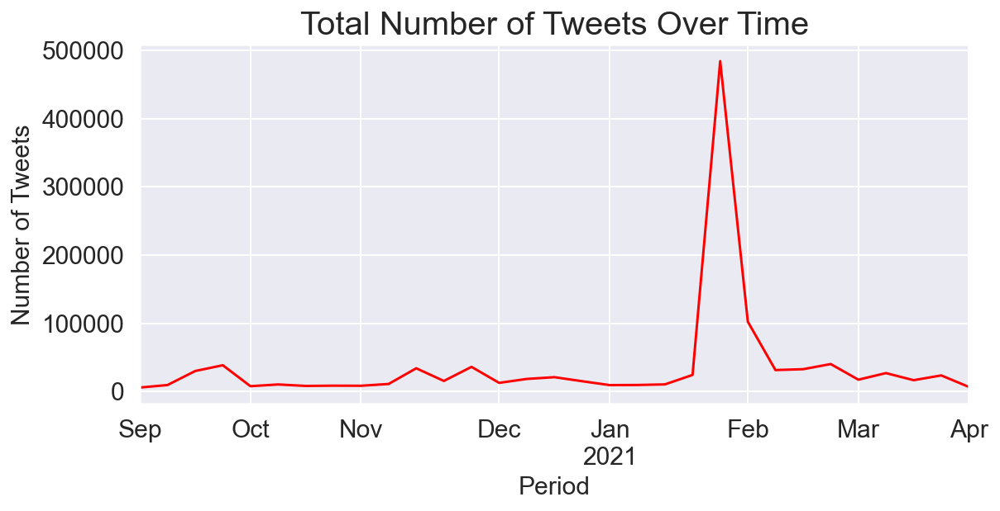

In [26]:
#check how the number of the tweets varies over the time
fig, ax = plt.subplots(figsize=(8, 4))
df_eda['content'].resample('W').count().plot(fontsize=15, ax = ax, color = 'red')
ax.set_title('Total Number of Tweets Over Time', fontsize=20)
ax.set_xlabel('Period', fontsize=15)
ax.set_ylabel('Number of Tweets', fontsize=15)
plt.show()
#fig.savefig('Total Number of Tweets Over Time.png', bbox_inches='tight')


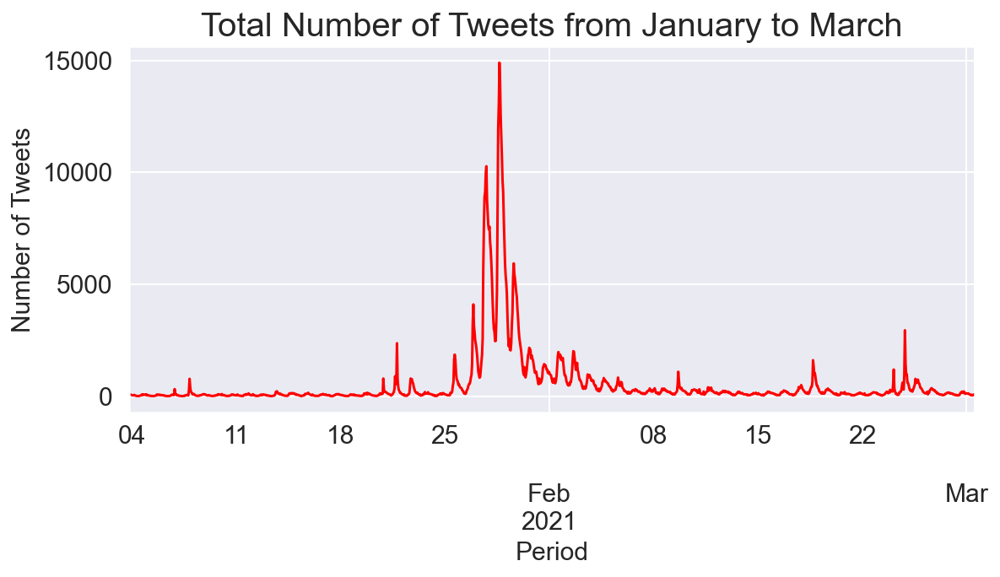

In [27]:
#check how the number of the tweets varies over time, focused between January to March
fig, ax = plt.subplots(figsize=(8, 4))
df_eda['content'][300000:-90000].resample('H').count().plot(fontsize=15, ax = ax, color = 'red')
ax.set_title('Total Number of Tweets from January to March', fontsize=20)
ax.set_xlabel('Period', fontsize=15)
ax.set_ylabel('Number of Tweets', fontsize=15)
plt.show()


#### Most Active Users

In [28]:
#check the most active usernames
username = df_eda['username'].value_counts(ascending = True)[-10:]
username

BotInventory       685
CrowdVectors       702
Wario64            837
newsfilterio       905
Goonglegangle      934
gomagpye           943
StckPro            988
videogamedeals    1033
alertario24hrs    1127
Weekendstravel    2358
Name: username, dtype: int64

In [29]:
#the user with username 'Weekendstravel', doesn't tweet about the 'gme' stock so will be dropped.
df_eda[df_eda.username == 'Weekendstravel'].head(2)
df_eda = df_eda[df_eda.username != 'Weekendstravel']

In [30]:
#the user with username 'alertario24hrs', seems to be an user that tweets about stocks, so it's related with the project.
df_eda[df_eda.username == 'alertario24hrs'].head(2)

,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-28 20:46:22+00:00,1.354894e+18,alertario24hrs,"@Melt_Dem ● Bitcoin, Stocks, Nasdaq, Game Stop, Tesla, Amazon, Alibaba, Nokia, Nike, Facebook, N...",False,0.0,0.0,0.0,105786.0,Twitter for Android,NaN,...,1,0,0,0,0,0,0,0,0,0
2021-01-28 20:46:41+00:00,1.354894e+18,alertario24hrs,"@zerohedge ● Bitcoin, Stocks, Nasdaq, Game Stop, Tesla, Amazon, Alibaba, Nokia, Nike, Facebook, ...",False,0.0,0.0,0.0,105786.0,Twitter for Android,NaN,...,1,0,0,0,0,0,0,0,0,0


In [31]:
#'videogamedeals' tweets about videogames, so I will exclude this user
df_eda[df_eda.username == 'videogamedealse'].head(2)
df_eda = df_eda[df_eda.username != 'videogamedeals']


In [32]:
#'StckPro' tweets about stocks and videogames, so I will keep this user
df_eda[df_eda.username == 'StckPro'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-11-10 22:34:41+00:00,1.326297e+18,StckPro,$GME NEW ARTICLE : GAmeStop +4% on early redemption of senior notes https://t.co/Wc3aZaAwRj Get ...,False,0.0,0.0,0.0,2930.0,STCK.PR0,NaN,...,0,0,0,0,2,0,0,0,0,0
2020-11-11 15:00:05+00:00,1.326547e+18,StckPro,$GME NEW ARTICLE : GameStop on watch as new consoles hit the market https://t.co/mvd7XMVUI1 Get ...,False,0.0,0.0,0.0,2930.0,STCK.PR0,NaN,...,0,0,0,1,2,0,0,0,0,0


In [33]:
#'gomagpye' tweets about videogames, so I will exclude this user
df_eda[df_eda.username == 'gomagpye'].head(2)
df_eda = df_eda[df_eda.username != 'gomagpye']


In [34]:
#the user with username 'Goonglegangle', doesn't tweet about the 'gme' stock so will be dropped.
df_eda[df_eda.username == 'Goonglegangle'].head(2)
df_eda = df_eda[df_eda.username != 'Goonglegangle']


In [35]:
#'newsfilterio' tweets about stocks and videogames, so I will keep this user
df_eda[df_eda.username == 'newsfilterio'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-09-01 11:02:21+00:00,1.300751e+18,newsfilterio,RC Ventures raises stake in GameStop to 9.6% $GME https://t.co/gzCOVtxaC8,False,0.0,1.0,0.0,13054.0,Newsfilter.io,NaN,...,0,0,0,0,1,0,0,0,0,0
2020-09-01 11:16:27+00:00,1.300754e+18,newsfilterio,GameStop bear still cautious into back half of the year $GME https://t.co/my6yhlU4db,False,0.0,0.0,0.0,13054.0,Newsfilter.io,NaN,...,0,0,0,0,1,0,0,0,0,0


In [36]:
#'Wario64' tweets about videogames, so I will exclude this user
df_eda[df_eda.username == 'Wario64'].head(10)
df_eda = df_eda[df_eda.username != 'Wario64']


In [37]:
#'CrowdVectors' tweets about videogames, so I will exclude this user
df_eda[df_eda.username == 'CrowdVectors'].head(2)
df_eda = df_eda[df_eda.username != 'CrowdVectors']


In [38]:
#'BotInventory' tweets about videogames, so I will exclude this user
df_eda[df_eda.username == 'BotInventory'].head(2)
df_eda = df_eda[df_eda.username != 'BotInventory']


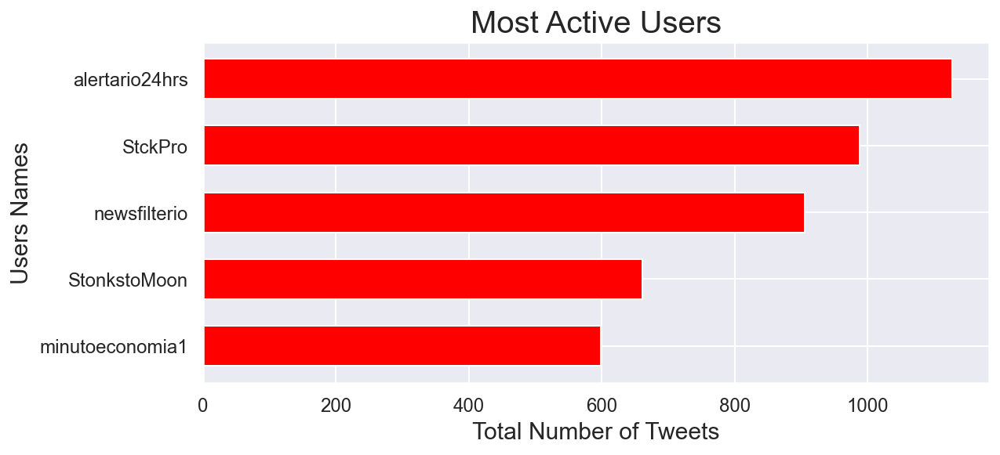

In [39]:
#check the most active usernames
#plt.figure(figsize=(8,4))
fig, ax = plt.subplots(figsize=(8, 4))
username = df_eda['username'].value_counts(ascending = True)[-5:]
username.plot.barh(color ='red', width = 0.6, fontsize = 12) ;
plt.ylabel("Users Names", fontsize = 15)
plt.xlabel("Total Number of Tweets", fontsize = 15)
plt.title("Most Active Users", fontsize = 20)
plt.show();
fig.savefig('Most Active Users.png', bbox_inches='tight')


#### Verified Status

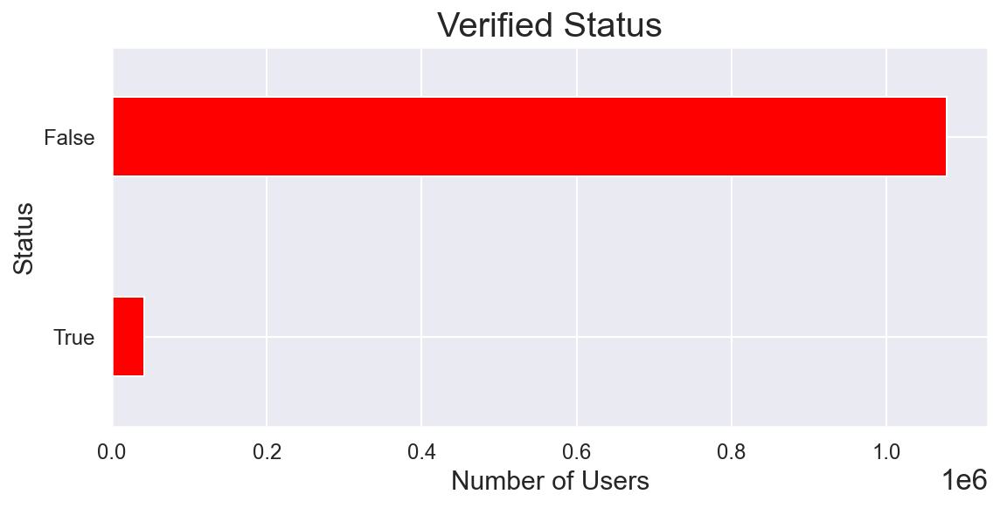

In [40]:
#check the verified status in percentage
fig, ax = plt.subplots(figsize=(8, 4))
verified_status = df_eda['verified_status'].value_counts(ascending = True)#/df_eda.shape[0]
verified_status.plot.barh(color ='red', width = 0.4, fontsize = 12) ;
plt.ylabel("Status", fontsize = 15)
plt.xlabel("Number of Users", fontsize = 15)
plt.title("Verified Status", fontsize = 20)
plt.show();
fig.savefig('Verified Status.png', bbox_inches='tight')



#### Reply Counts

In [41]:
#users with higher number of replies
df_eda.groupby('username')['reply_count'].sum().nlargest(10).iloc[::-1]


username
zerohedge          7223.0
mattswider         7569.0
WSBChairman        7776.0
nytimes            8537.0
MarketWatch        9678.0
PS5StockAlerts    11138.0
jimcramer         12346.0
SenWarren         15054.0
CNBC              17754.0
GameStop          49129.0
Name: reply_count, dtype: float64

In [42]:
#'GameStop' tweets about videogames, so I will exclude this user
df_eda[df_eda.username == 'GameStop'].head(2)
df_eda = df_eda[df_eda.username != 'GameStop']


In [43]:
#'CNBC' is a verified user that tweets about the stock
df_eda[df_eda.username == 'CNBC'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-09-09 21:35:11+00:00,1.303809e+18,CNBC,"Stocks making the biggest moves after hours: RH, Zscaler, GameStop &amp; more https://t.co/hwiKO...",True,4.0,13.0,2.0,4082153.0,SocialFlow,NaN,...,1,0,0,0,0,0,0,0,0,0
2020-09-10 11:41:45+00:00,1.304022e+18,CNBC,"Stocks making the biggest moves in the premarket: AstraZeneca, RH, GameStop, Quest Diagnostics &...",True,21.0,11.0,0.0,4082153.0,SocialFlow,NaN,...,1,0,0,0,0,0,0,0,0,0


In [44]:
#'SenWarren' is a U.S. Senator and tweets about the stocks
df_eda[df_eda.username == 'SenWarren'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-27 20:03:19+00:00,1.354521e+18,SenWarren,"For years, the same hedge funds, private equity firms, and wealthy investors dismayed by the Gam...",True,306.0,15195.0,364.0,6951502.0,Twitter Web App,NaN,...,1,0,0,1,0,1,0,0,0,0
2021-01-28 20:08:35+00:00,1.354884e+18,SenWarren,I'll be joining @CNBCClosingBell at 3:30 ET to discuss GameStop and the work regulators need to ...,True,349.0,5618.0,76.0,6951502.0,Twitter Web App,NaN,...,0,0,0,1,0,0,0,0,0,0


In [45]:
#'jimcramer' former hedge fund manager and host of Mad Money on CNBC. His tweets are about stocks
df_eda[df_eda.username == 'jimcramer'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-13 16:34:32+00:00,1.349405e+18,jimcramer,Memo to George Sherman and the people who run Gamestop. You are OUT OF YOUR MINDS if you don't o...,True,41.0,383.0,9.0,1664353.0,TweetDeck,NaN,...,1,0,0,0,0,0,1,0,0,0
2021-01-13 16:37:32+00:00,1.349406e+18,jimcramer,"Gamestop could, literally, pay down all of its debt right now right here.. How can it not take a...",True,62.0,640.0,8.0,1664353.0,TweetDeck,NaN,...,0,0,0,0,0,0,0,0,0,0


In [46]:
#'PS5StockAlerts' tweets about videogames, so I will exclude this user
df_eda[df_eda.username == 'PS5StockAlerts'].head(2)
df_eda = df_eda[df_eda.username != 'PS5StockAlerts']

In [47]:
#'MarketWatch' website that provides financial information, business news, analysis, and stock market data.
df_eda[df_eda.username == 'MarketWatch'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-12-08 20:09:08+00:00,1.336420e+18,MarketWatch,GameStop shares drop 10% on big drop in revenue https://t.co/yA5WIOuQY7,True,1.0,16.0,2.0,4005872.0,MarketWatch,NaN,...,0,0,0,0,0,0,1,0,0,0
2021-01-11 07:10:51+00:00,1.348631e+18,MarketWatch,GameStop's stock shoots up after reaching agreement with activist investor https://t.co/eUyCdN9Ltl,True,0.0,11.0,2.0,4005857.0,SocialFlow,NaN,...,1,0,0,0,0,0,0,0,0,0


In [48]:
#'nytimes'  New York Times is an American daily newspaper.
df_eda[df_eda.username == 'nytimes'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-25 22:53:52+00:00,1.353845e+18,nytimes,"Shares of the struggling video game retailer GameStop surged on Monday, adding to a recent rally...",True,26.0,235.0,14.0,49818152.0,Twitter Web App,NaN,...,1,0,0,0,0,0,1,0,0,0
2021-01-27 15:13:26+00:00,1.354448e+18,nytimes,"Why is Wall Street obsessed with GameStop, the video game chain that until recently was known fo...",True,258.0,2085.0,222.0,49818072.0,SocialFlow,NaN,...,1,0,0,0,0,0,0,1,0,0


In [49]:
#'WSBChairman'  is the creator of WallStreetBets sub Reddit
df_eda[df_eda.username == 'WSBChairman'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-25 13:38:13+00:00,1.353705e+18,WSBChairman,Gamestop up 51% to $98 in Pre-Market🤯 https://t.co/tjyIrPxoIY,False,4.0,23.0,2.0,910561.0,Twitter for iPhone,🤯,...,0,0,0,1,0,0,0,0,0,0
2021-01-25 15:34:29+00:00,1.353729e+18,WSBChairman,BREAKING: GameStop ( $GME ) announces acquisition of Blockbuster.,False,2.0,59.0,0.0,910560.0,Twitter for iPhone,NaN,...,0,0,0,0,1,0,0,0,0,0


In [50]:
#'mattswider'  tweets about videogames
df_eda[df_eda.username == 'mattswider'].head(2)
df_eda = df_eda[df_eda.username != 'mattswider']


In [51]:
#'mattswider'  financial blog
df_eda[df_eda.username == 'zerohedge'].head(2)
#df_eda = df_eda[df_eda.username != 'zerohedge']


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-19 14:10:02+00:00,1.351557e+18,zerohedge,GameStop pared gains after short-seller Citron Research tweeted that it sees the stock returning...,False,13.0,105.0,4.0,940413.0,TweetDeck,NaN,...,1,0,2,0,0,0,0,0,0,0
2021-01-22 07:05:53+00:00,1.352605e+18,zerohedge,"Citron Research Says ""Hacking Attempts"" Interrupted Livestream Detailing GameStop Short https://...",False,15.0,83.0,6.0,940412.0,Zero Hedge Publisher II,NaN,...,0,0,1,0,0,0,0,0,0,0


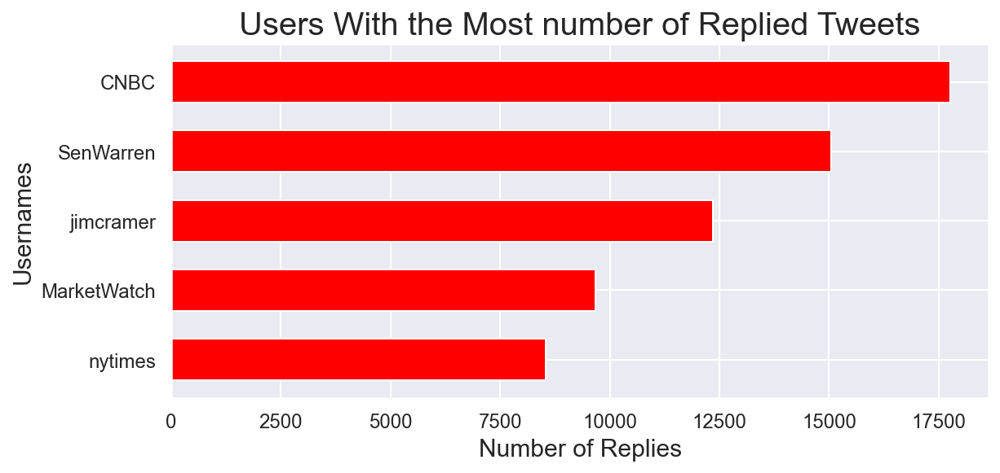

In [52]:
#check the users with the higher number of replied tweets
fig, ax = plt.subplots(figsize=(8, 4))
reply_count = df_eda.groupby('username')['reply_count'].sum().nlargest(5).iloc[::-1]
reply_count.plot.barh(color ='red', width = 0.6, fontsize = 12) ;
plt.ylabel("Usernames", fontsize = 15)
plt.xlabel("Number of Replies", fontsize = 15)
plt.title("Users With the Most number of Replied Tweets", fontsize = 20)
plt.show();
fig.savefig('Users With the Most number of Replied Tweets.png', bbox_inches='tight')



#### Like Count

In [53]:
reply_count = df_eda.groupby('username')['like_count'].sum().nlargest(10).iloc[::-1]
reply_count


username
KatieRagosta    242703.0
_ZevLoveX       247663.0
AOC             322940.0
mannyfidel      334010.0
Slasher         343778.0
MrBeast         395409.0
RBReich         501051.0
WSBChairman     581828.0
KevinFarzad     816354.0
Jordan_Deeb     953946.0
Name: like_count, dtype: float64

In [54]:
#'Jordan_Deeb' host over at @waypointpodcast and tweets about stock and games.
df_eda[df_eda.username == 'Jordan_Deeb'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-12-16 23:32:17+00:00,1.339375e+18,Jordan_Deeb,When I was working at GameStop someone bought one of these keys online and stole every iPhone we...,False,0.0,1.0,0.0,1272.0,Twitter for iPhone,NaN,...,0,0,0,0,0,0,0,0,0,0
2021-01-27 16:58:12+00:00,1.354474e+18,Jordan_Deeb,GameStop sitting amongst Tesla and Amazon after reddit users make it a Fortune 500 company https...,False,1614.0,952958.0,4619.0,1272.0,Twitter for iPhone,NaN,...,0,0,0,0,0,0,0,1,0,0


In [55]:
#'KevinFarzad' only post an unique tweet and it was about the stock. The tweet was quite popular with 816354 numbers of likes.
df_eda[df_eda.username == 'KevinFarzad']

,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-27 22:17:11+00:00,1.354554e+18,KevinFarzad,"I know this GameStop stuff is funny, but you have to remember this is hurting real people who ow...",False,3773.0,816354.0,3761.0,101587.0,Twitter for iPhone,NaN,...,0,0,0,0,0,0,0,0,0,0


In [56]:
#'WSBChairman' Wall Street Bets subreddit manager. Tweets about stocks.
df_eda[df_eda.username == 'WSBChairman'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-25 13:38:13+00:00,1.353705e+18,WSBChairman,Gamestop up 51% to $98 in Pre-Market🤯 https://t.co/tjyIrPxoIY,False,4.0,23.0,2.0,910561.0,Twitter for iPhone,🤯,...,0,0,0,1,0,0,0,0,0,0
2021-01-25 15:34:29+00:00,1.353729e+18,WSBChairman,BREAKING: GameStop ( $GME ) announces acquisition of Blockbuster.,False,2.0,59.0,0.0,910560.0,Twitter for iPhone,NaN,...,0,0,0,0,1,0,0,0,0,0


In [57]:
#'RBReich' Robert Reich is a Berkeley professor, former Secretary of Labor and he tweet about the stock itself.
df_eda[df_eda.username == 'RBReich'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-28 01:20:45+00:00,1.354601e+18,RBReich,"If Redditors rallying GameStop is unacceptable market manipulation, what would you call it when ...",True,3694.0,342503.0,2414.0,1322770.0,Twitter for iPhone,NaN,...,0,0,0,1,0,0,0,0,0,0
2021-01-28 18:45:02+00:00,1.354863e+18,RBReich,This needs to be investigated.\n\nApparently market manipulation is just fine when it’s greedy W...,True,113.0,7606.0,46.0,1322765.0,Twitter Web App,NaN,...,0,0,0,1,0,1,0,0,0,1


In [58]:
#'MrBeast' Jimmy Donaldson, is an American YouTuber and philanthropist. His tweets were about stocks.
df_eda[df_eda.username == 'MrBeast'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-12-28 16:07:38+00:00,1.343617e+18,MrBeast,"Here is a list of the gift cards!\n$10,000 Best Buy\n$10,000 GameStop\n$10,000 Hardee’s\n$10,000...",True,1192.0,48378.0,314.0,10276089.0,Twitter for iPhone,NaN,...,0,1,0,0,0,0,0,0,0,0
2021-01-30 00:54:30+00:00,1.355320e+18,MrBeast,"Wait a minute, you guy’s are buying GameStop stock? I thought I was supposed to buy an actual Ga...",True,2794.0,252556.0,607.0,10275273.0,Twitter for iPhone,NaN,...,1,2,0,0,0,0,0,0,0,0


In [59]:
#'Slasher' user that tweets about the stock
df_eda[df_eda.username == 'Slasher'].head(2)

,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-26 20:02:01+00:00,1.354160e+18,Slasher,"GameStop will never die, when line go up is truly beautiful https://t.co/Po3jNQQbpj",True,91.0,3623.0,29.0,445810.0,Twitter Web App,NaN,...,0,0,0,0,0,0,0,0,0,0
2021-01-26 21:50:47+00:00,1.354186e+18,Slasher,"lmao GameStop hits 230 after hours and is now worth more than $10 billion. WSB, reddit, and game...",True,84.0,10251.0,133.0,445810.0,Twitter Web App,NaN,...,0,0,0,0,0,0,0,1,0,0


In [60]:
#'mannyfidel' columnist/editor for @businessinsider
df_eda[df_eda.username == 'mannyfidel'].head(2)

,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-26 23:25:50+00:00,1.354210e+18,mannyfidel,me definitely understanding the game stop/wall street discourse https://t.co/1VO6xbdZl4,True,11.0,380.0,2.0,21892.0,Twitter Web App,NaN,...,0,0,0,0,0,0,0,0,0,0
2021-01-26 23:31:57+00:00,1.354211e+18,mannyfidel,gamestop stocks are crazy man haha they totally shorted the uhhh the market cap. yeah never seen...,True,3.0,420.0,0.0,21892.0,Twitter Web App,NaN,...,2,0,1,2,0,1,0,0,0,0


In [61]:
#'AOC' Alexandria Ocasio-Cortez, American politician serving the U.S.
df_eda[df_eda.username == 'AOC'].head(2)

,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-28 19:06:22+00:00,1.354869e+18,AOC,I’ll be hopping on Twitch at 8:30pm tonight to discuss today’s developments with GameStop and re...,True,5765.0,320736.0,2458.0,12686312.0,Twitter for iPhone,👾,...,0,0,0,0,0,1,0,0,0,0
2021-02-18 19:27:26+00:00,1.362489e+18,AOC,@katekelly @GameStop I’m towards the end - 3rd from last Dem.,True,144.0,2204.0,12.0,12686461.0,Twitter for iPhone,NaN,...,0,0,0,0,0,0,0,0,0,0


In [62]:
#'_ZevLoveX' British-American rapper, tweeted about the stock
df_eda[df_eda.username == '_ZevLoveX'].head(2)

,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-26 21:29:35+00:00,1.354181e+18,_ZevLoveX,"Just to let y’all know, people on Reddit are buying lots of shares in GameStop to raise the pric...",False,553.0,247663.0,2539.0,478.0,Twitter for iPhone,NaN,...,2,1,0,0,0,0,1,1,0,0


In [63]:
#'KatieRagosta' tweeted about stock market
df_eda[df_eda.username == 'KatieRagosta'].head(2)

,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-27 00:06:38+00:00,1.354220e+18,KatieRagosta,Trying to figure out what’s going on with Game Stop like https://t.co/cD4AcKOXHN,False,329.0,240404.0,1326.0,93.0,Twitter for iPhone,NaN,...,0,0,0,0,0,0,0,0,0,0
2021-01-27 15:40:03+00:00,1.354455e+18,KatieRagosta,"@Nikoradfan @dexbonus The TL;DR seems to be that Game Stop had been going downhill, so some hedg...",False,3.0,351.0,2.0,93.0,Twitter for iPhone,NaN,...,2,1,1,0,0,0,0,0,0,0


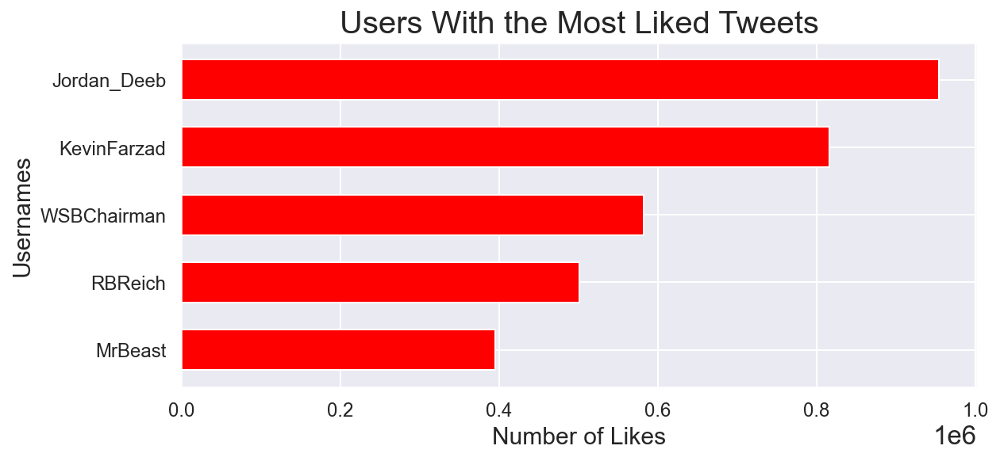

In [64]:
#check the users with the higher number of liked tweets
fig, ax = plt.subplots(figsize=(8, 4))
reply_count = df_eda.groupby('username')['like_count'].sum().nlargest(5).iloc[::-1]
reply_count.plot.barh(color ='red', width = 0.6, fontsize = 12) ;
plt.ylabel("Usernames", fontsize = 15)
plt.xlabel("Number of Likes", fontsize = 15)
plt.title("Users With the Most Liked Tweets", fontsize = 20)
plt.show();
fig.savefig('Users With the Most Liked Tweets.png', bbox_inches='tight')



#### Quote Count

In [65]:
df_eda.groupby('username')['quote_count'].sum().nlargest(10).iloc[::-1]


username
WSJ                5552.0
Slasher            5772.0
MarketWatch        6168.0
business           6218.0
jeneps             6550.0
nytimes            6830.0
SenWarren          8591.0
CNBC               8616.0
Street_Insider     8628.0
DiscussingFilm    12607.0
Name: quote_count, dtype: float64

In [66]:
#'DiscussingFilm' is a website fully dedicated to cinema. His tweets were about stocks.
df_eda[df_eda.username == 'DiscussingFilm'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-02-01 00:17:43+00:00,1.356038e+18,DiscussingFilm,‘THE ANTISOCIAL NETWORK’ is in the works at MGM.\n\nThe film follows the Wall Street chaos after...,False,312.0,3906.0,1552.0,198135.0,Twitter for iPhone,NaN,...,1,0,0,0,0,0,0,1,0,0
2021-02-01 17:28:53+00:00,1.356296e+18,DiscussingFilm,Noah Centineo has been cast in an untitled film about the Wall Street chaos from GameStop’s stoc...,False,1319.0,9964.0,10417.0,198134.0,Twitter for iPhone,NaN,...,1,0,0,0,0,0,0,1,0,0


In [67]:
#'Street_Insider' is a website fully dedicated to cinema. His tweets were about stocks.
df_eda[df_eda.username == 'Street_Insider'].head(2)


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2020-09-14 11:53:11+00:00,1.305479e+18,Street_Insider,Jefferies Upgrades GameStop $GME to Buy; 'Cycle Trade Is On' https://t.co/vJ5YdX295s https://t.c...,False,0.0,1.0,0.0,70946.0,Loomly,NaN,...,0,1,0,0,1,1,0,0,0,0
2020-10-08 17:16:45+00:00,1.314265e+18,Street_Insider,GameStop $GME Enters Multi-year Strategic Partnership with Microsoft $MSFT https://t.co/25LB5nG7uM,False,1.0,2.0,2.0,70945.0,TweetDeck,NaN,...,0,0,0,0,1,0,0,0,0,0


In [68]:
#'jeneps' White House reporter at Bloomberg News, tweets about stocks
df_eda[df_eda.username == 'jeneps'].head(2)



,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,stock,buy,short,market,gme,trade,share,reddit,order,amc
2021-01-27 18:21:08+00:00,1.354495e+18,jeneps,"Biden team is ""monitoring the situation"" around GameStop.",True,2063.0,32661.0,6292.0,147983.0,TweetDeck,NaN,...,0,0,0,0,0,0,0,0,0,0
2021-01-27 19:46:04+00:00,1.354516e+18,jeneps,"Fed Chair Powell gets a GameStop question and ducks it: ""I don't want to comment on a particular...",True,32.0,1402.0,14.0,147983.0,TweetDeck,NaN,...,0,0,0,1,0,0,0,0,0,0


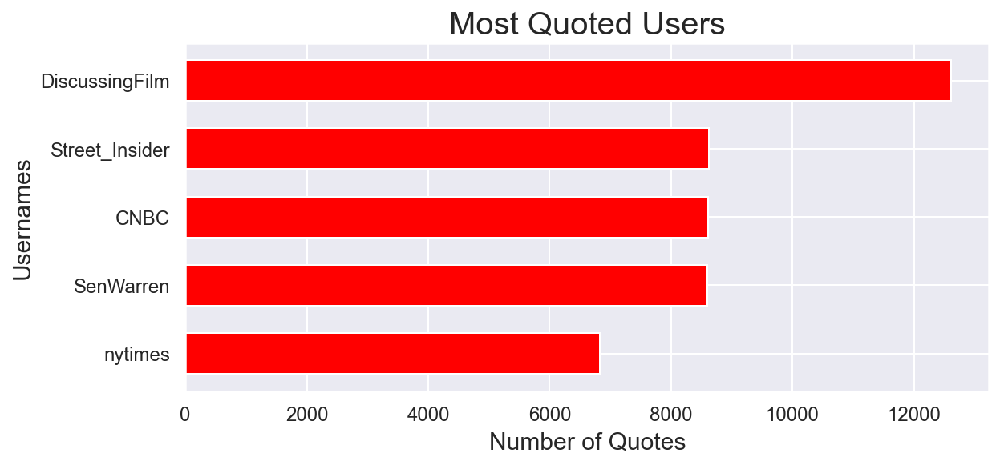

In [69]:
#check the users with the higher number of liked tweets
fig, ax = plt.subplots(figsize=(8, 4))
quote_count = df_eda.groupby('username')['quote_count'].sum().nlargest(5).iloc[::-1]
quote_count.plot.barh(color ='red', width = 0.6, fontsize = 12) ;
plt.ylabel("Usernames", fontsize = 15)
plt.xlabel("Number of Quotes", fontsize = 15)
plt.title("Most Quoted Users", fontsize = 20)
plt.show();
fig.savefig('Most Quoted Users.png', bbox_inches='tight')




#### Number of Followers by User

The users with more followers are all institutions. From top to bottom we have 'Reuters', 'WSJ' the 'Wall Street Journal', 'nytimes' the 'The New York Times', 'Forbes' and 'Business'. All top 5 are newspappers with a worldwide readership.


In [70]:
df_eda.groupby(['username'])['number_followers'].sum().sort_values(ascending=True)[-10:]

username
ABC             9.143606e+08
MarketWatch     1.265827e+09
TheEconomist    1.358697e+09
CNBC            1.461360e+09
CNN             1.980725e+09
business        2.175167e+09
Forbes          2.584688e+09
nytimes         2.789778e+09
WSJ             2.895455e+09
Reuters         9.500555e+09
Name: number_followers, dtype: float64

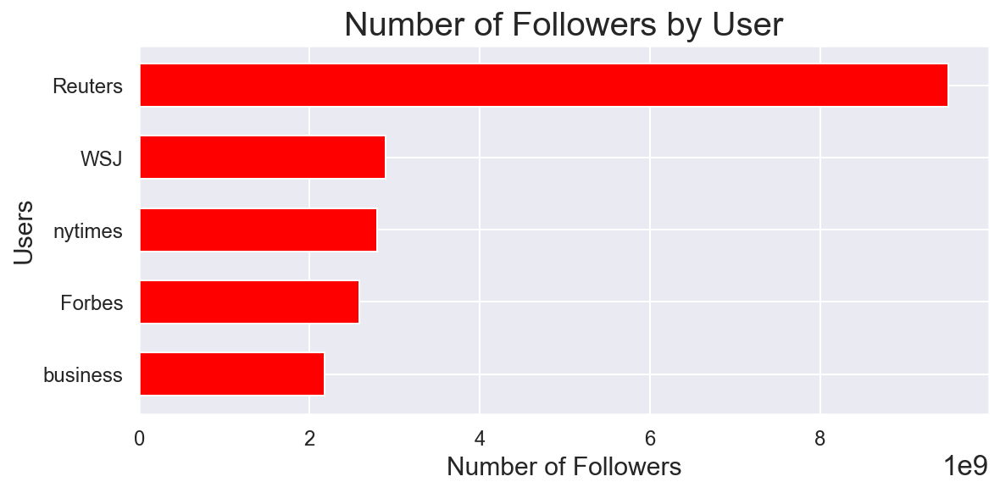

In [71]:
#check the number of null values to see if any features can be eliminated
fig, ax = plt.subplots(figsize=(8, 4))
num_followers = df_eda.groupby(['username'])['number_followers'].sum().sort_values(ascending=True)[-5:]
num_followers.plot.barh(color ='red', width = 0.6, fontsize = 12) ;
plt.ylabel("Users", fontsize = 15)
plt.xlabel("Number of Followers", fontsize = 15)
plt.title("Number of Followers by User", fontsize = 20)
plt.show();
fig.savefig('Number of Followers by User.png', bbox_inches='tight')




### 4.4.2 Text Exploration

#### Most Frequent Words in the Text

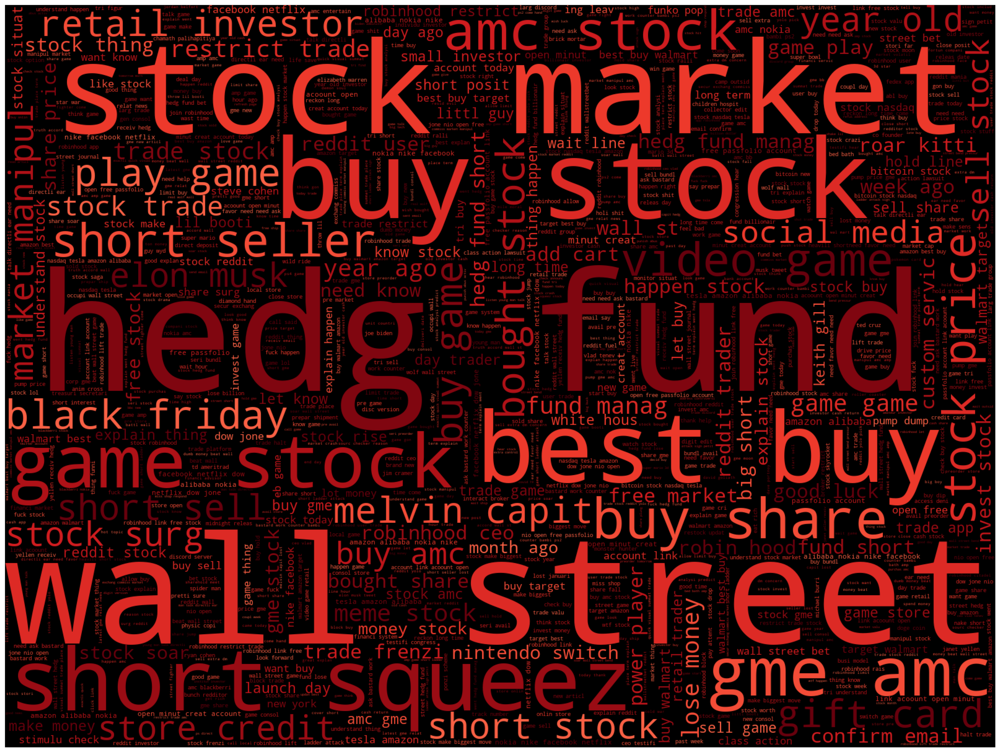

In [72]:
word_cloud_barchart('tfid', df_eda, 'stemmer_text', 'Word Cloud', (2,4))




/Users/anasfmatias/opt/anaconda3/envs/fproject/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


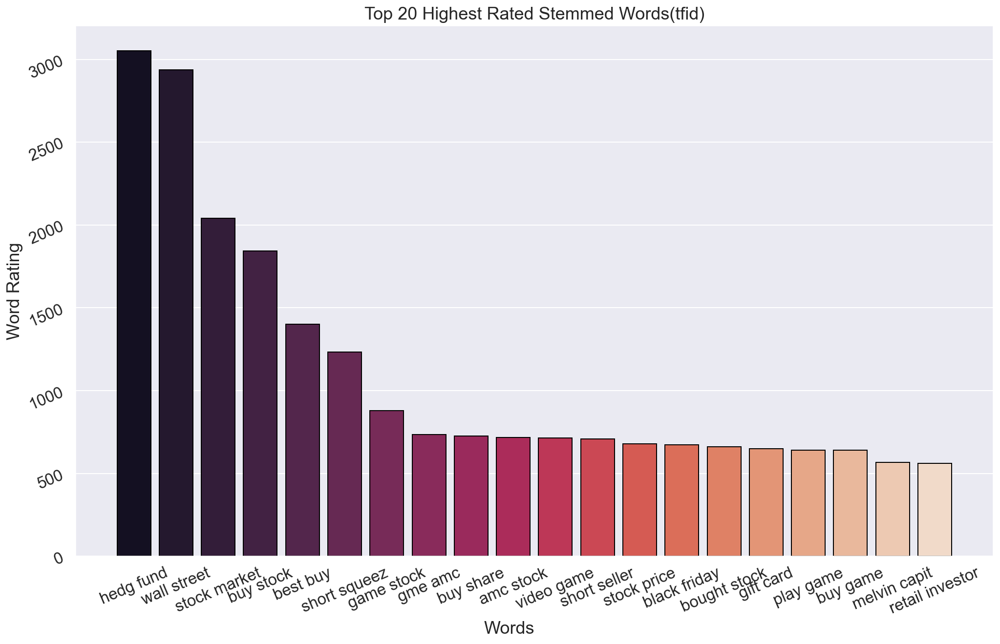

In [73]:
word_cloud_barchart('tfid', df_eda, 'stemmer_text', 'Bar Chart', (2,4))


#### Words Used more Times in the Text

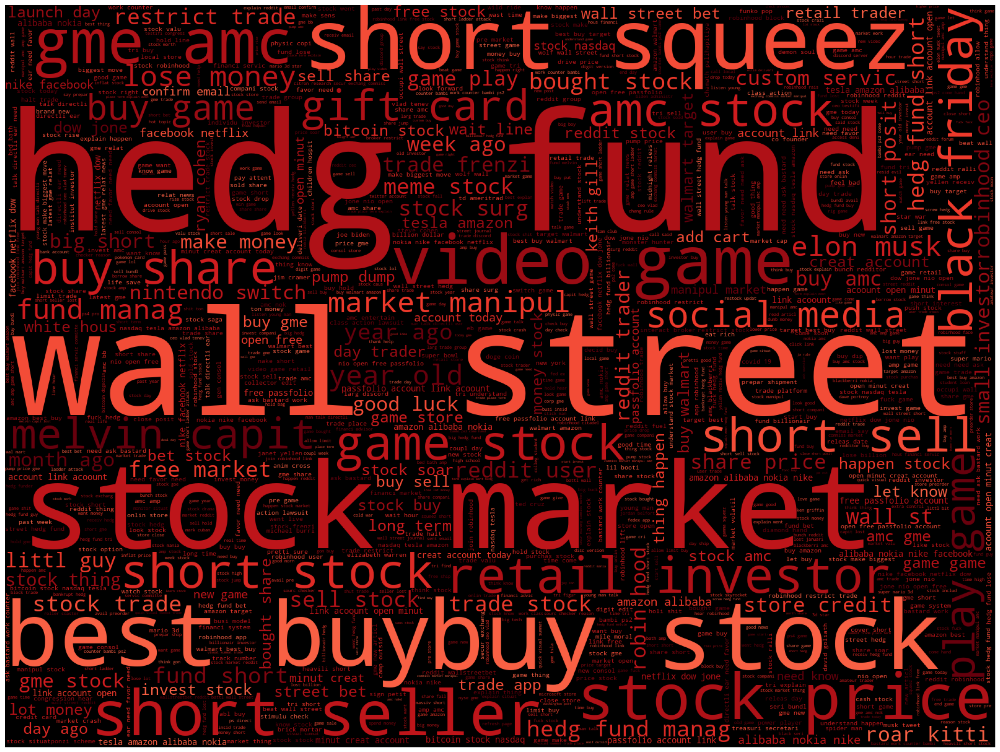

In [74]:
word_cloud_barchart('cvec', df_eda, 'stemmer_text', 'Word Cloud', (2,4))


/Users/anasfmatias/opt/anaconda3/envs/fproject/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


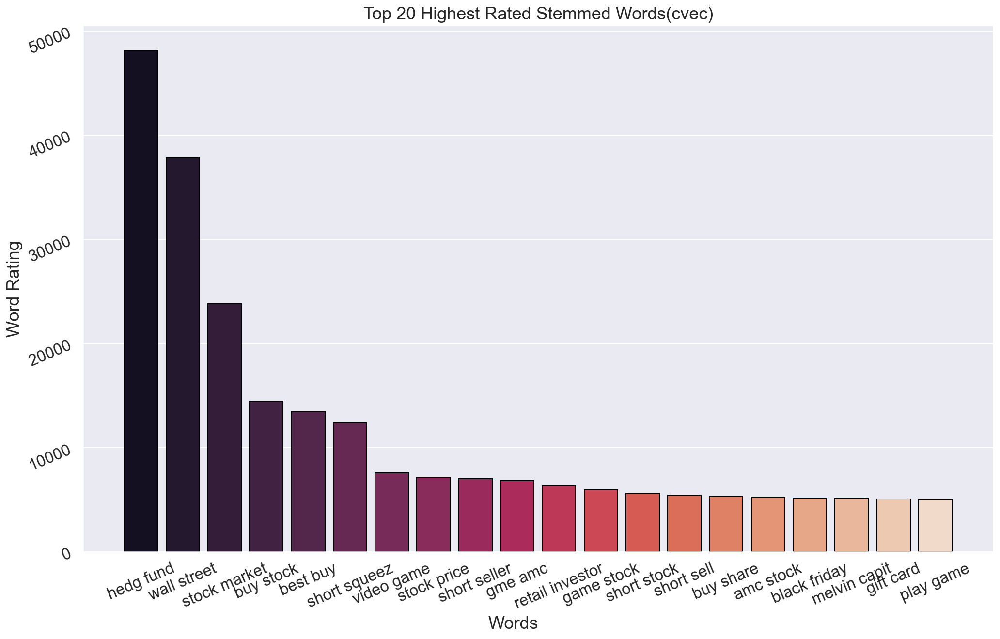

In [75]:
fig = word_cloud_barchart('cvec', df_eda, 'stemmer_text', 'Bar Chart', (2,4))


#### Sentiment Status
Below are two bar plots that show the total number per sentiment for the Spacy method and Vader method. It is clear for both graphics that the positive sentiment is dominant, followed by the negative and neutral. 

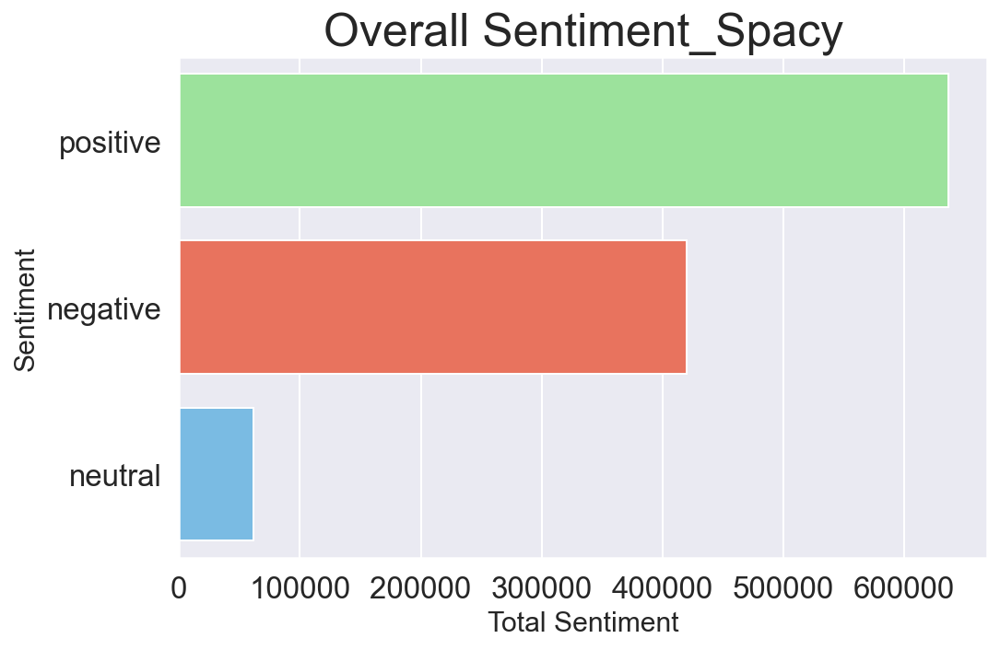

In [76]:
fig, ax = plt.subplots(figsize=(7, 5))
sns.countplot( y="sentiment", data=df_eda, palette={"negative": "tomato", "positive": "lightgreen", "neutral": "#68BFF5"})
plt.ylabel("Sentiment", fontsize = 15)
plt.xlabel("Total Sentiment", fontsize = 15)
plt.title("Overall Sentiment_Spacy", fontsize = 25)
plt.show()
fig.savefig('Overall Sentiment_Spacy.png', bbox_inches='tight')

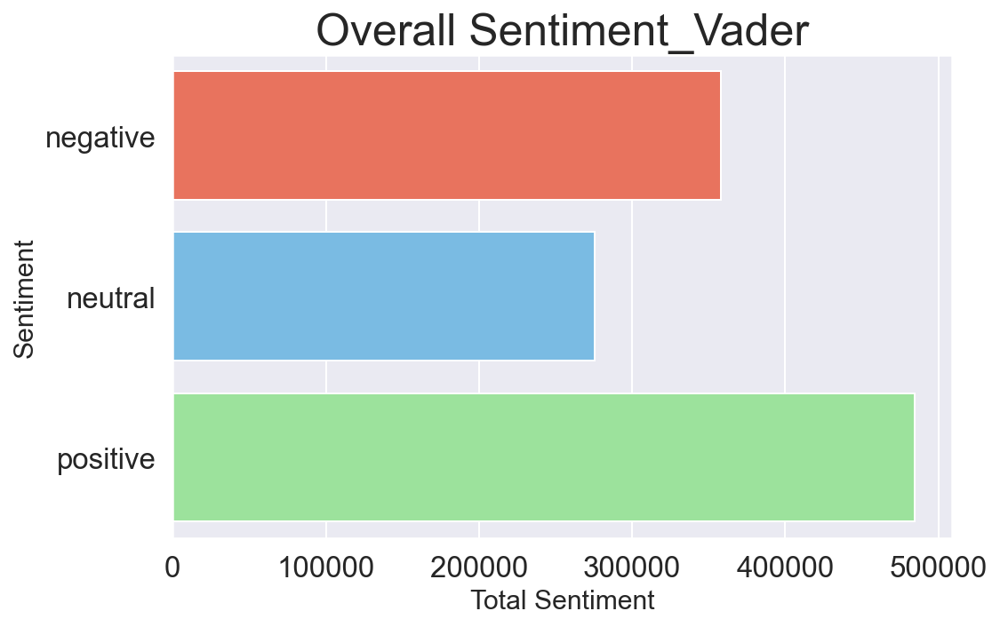

In [77]:
fig, ax = plt.subplots(figsize=(7, 5))
sns.countplot(y="vader_sentiment", data=df_eda, 
              palette={"negative": "tomato", "positive": "lightgreen", "neutral": "#68BFF5"}, 
              hue_order= ['positive', 'negative', 'neutral'])
plt.ylabel("Sentiment", fontsize = 15)
plt.xlabel("Total Sentiment", fontsize = 15)
plt.title("Overall Sentiment_Vader", fontsize = 25)
plt.show()
fig.savefig('Overall Sentiment_Vader.png', bbox_inches='tight')

#### Check the Most Popular Words

In [ ]:
#type(df_eda.index) == pd.core.indexes.datetimes.DatetimeIndex 


#### Check the Most Extreme Tweet
Analyse the correlation between the numerical features to find which one has the higher correlations with the remaining features. 


In [78]:
#define a new dataframe with just numerical values
df_eda_1 = df_eda[['verified_status', 'reply_count', 'like_count', 'quote_count', 'number_followers', 
                   'text_len', 'objectivity_avg', 'polarity_avg', 'vader_compound', 'vader_neg', 'vader_neu', 
                   'vader_pos', 'stock', 'buy', 'short', 'market', 'gme', 'trade', 'share', 'reddit', 'order',
                   'amc']]


In [79]:
#standardize the new data
scaler = StandardScaler()
df_eda_scl = pd.DataFrame(scaler.fit_transform(df_eda_1), columns = df_eda_1.columns, index = df_eda_1.index)


#### Check for Outliers

Examination of the Box Plot, we can observe a couple of outliers.  I will inspect the most replied with 'reply count', the most liked with 'Like Count' and the most quoted with  'Quote Count'. 

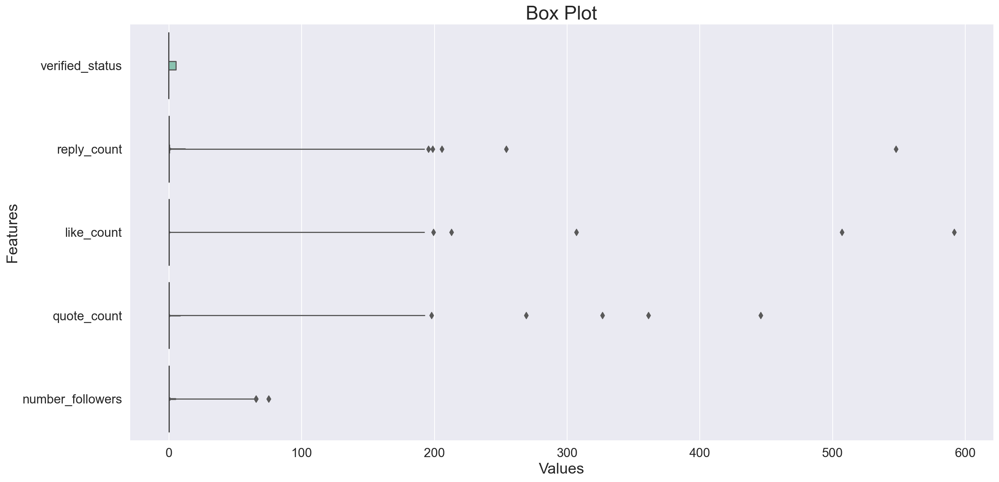

In [80]:
fig_box = plt.figure(figsize=(18, 10))
ax = sns.boxenplot(data=df_eda_scl[['verified_status', 'reply_count', 'like_count', 'quote_count', 'number_followers']], orient="h", palette="Set2")
ax.set_title('Box Plot', fontsize=25)
ax.set_xlabel('Values', fontsize=20)
ax.set_ylabel('Features', fontsize=20)
#ax.set_yscale('log')
plt.show()

The tweet with the most replies belongs to the user 'SenWarren', followed by the user 'AOC'. Both are verified users. Both algorithms classify the two tweets as positives. In third place is a negative tweet from Street_insider with negative sentiment.

In [81]:
df_eda.sort_values(by = 'reply_count', ascending=False).iloc[:5, :26]


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,lemmatized_text,stemmer_text,objectivity_avg,polarity_avg,sentiment,vader_compound,vader_neg,vader_neu,vader_pos,vader_sentiment
2021-01-29 16:10:19+00:00,1.355187e+18,SenWarren,Casino-like swings in stock prices of GameStop reflect wild levels of speculation that don’t hel...,True,12430.0,17244.0,7634.0,6951480.0,Twitter Web App,NaN,...,Casino like swing stock price GameStop reflect wild level speculation help GameStop worker custo...,casino like swing stock price gamestop reflect wild level specul help gamestop worker custom lea...,0.893444,0.050737,positive,0.1531,0.051,0.860,0.088,positive
2021-01-28 19:06:22+00:00,1.354869e+18,AOC,I’ll be hopping on Twitch at 8:30pm tonight to discuss today’s developments with GameStop and re...,True,5765.0,320736.0,2458.0,12686312.0,Twitter for iPhone,👾,...,hopping Twitch tonight discus today development GameStop retail trading guest join,hop twitch tonight discuss today develop gamestop retail trade guest join,0.992188,0.007812,positive,0.3595,0.000,0.926,0.074,positive
2021-01-27 14:03:12+00:00,1.354431e+18,Street_Insider,CNBC's David Faber said he is hearing a number of hedge funds are in similar trouble that Melvin...,False,4669.0,12480.0,8444.0,70941.0,StockTwits Web,NaN,...,CNBC David Faber said hearing number hedge fund similar trouble Melvin Capital saw GameStop $ GM...,cnbc david faber said hear number hedg fund similar troubl melvin capit saw gamestop $ gme need ...,0.882860,-0.015720,negative,-0.3400,0.082,0.879,0.039,negative
2021-01-28 15:55:47+00:00,1.354821e+18,WSBChairman,GameStop united the country at a time when nothing else could.,False,4510.0,494076.0,1773.0,910581.0,Twitter for iPhone,NaN,...,GameStop united country time,gamestop unit countri time,0.951389,0.034722,positive,0.4215,0.000,0.781,0.219,positive
2021-01-27 19:27:47+00:00,1.354512e+18,ChrisCillizza,How Trumpism explains the GameStop stock surge\n\nhttps://t.co/DFSgxe265j,True,4436.0,821.0,2556.0,655564.0,Twitter Web App,NaN,...,Trumpism explains GameStop stock surge,trumpism explain gamestop stock surg,0.928105,-0.011438,negative,0.0000,0.000,1.000,0.000,neutral


The tweets with a higher number of likes are presented below. Both algorithms are following each other except the first one. Vader sentiment classifies Jordan_Deed's tweet as positive, while spacy considers it negative. A human analysis reveals that the tweet is positive, and the spacy misclassified this tweet.

In [82]:
df_eda.sort_values(by = 'like_count', ascending=False).iloc[:5, :26]


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,lemmatized_text,stemmer_text,objectivity_avg,polarity_avg,sentiment,vader_compound,vader_neg,vader_neu,vader_pos,vader_sentiment
2021-01-27 16:58:12+00:00,1.354474e+18,Jordan_Deeb,GameStop sitting amongst Tesla and Amazon after reddit users make it a Fortune 500 company https...,False,1614.0,952958.0,4619.0,1272.0,Twitter for iPhone,NaN,...,GameStop sitting Tesla Amazon reddit user Fortune company,gamestop sit tesla amazon reddit user fortun compani,0.987500,-0.012500,negative,0.1779,0.000,0.892,0.108,positive
2021-01-27 22:17:11+00:00,1.354554e+18,KevinFarzad,"I know this GameStop stuff is funny, but you have to remember this is hurting real people who ow...",False,3773.0,816354.0,3761.0,101587.0,Twitter for iPhone,NaN,...,know GameStop stuff funny remember hurting real people multiple boat,know gamestop stuff funni rememb hurt real peopl multipl boat,0.828917,-0.059266,negative,-0.3818,0.145,0.776,0.080,negative
2021-01-28 15:55:47+00:00,1.354821e+18,WSBChairman,GameStop united the country at a time when nothing else could.,False,4510.0,494076.0,1773.0,910581.0,Twitter for iPhone,NaN,...,GameStop united country time,gamestop unit countri time,0.951389,0.034722,positive,0.4215,0.000,0.781,0.219,positive
2021-01-28 01:20:45+00:00,1.354601e+18,RBReich,"If Redditors rallying GameStop is unacceptable market manipulation, what would you call it when ...",True,3694.0,342503.0,2414.0,1322770.0,Twitter for iPhone,NaN,...,Redditors rallying GameStop unacceptable market manipulation greedy Wall Street banker gambled a...,redditor ralli gamestop unaccept market manipul greedi wall street banker gambl away entir econo...,0.858055,-0.008265,negative,-0.8271,0.280,0.720,0.000,negative
2021-01-28 19:06:22+00:00,1.354869e+18,AOC,I’ll be hopping on Twitch at 8:30pm tonight to discuss today’s developments with GameStop and re...,True,5765.0,320736.0,2458.0,12686312.0,Twitter for iPhone,👾,...,hopping Twitch tonight discus today development GameStop retail trading guest join,hop twitch tonight discuss today develop gamestop retail trade guest join,0.992188,0.007812,positive,0.3595,0.000,0.926,0.074,positive


In [83]:
df_different = df_eda.sort_values(by = 'like_count', ascending=False)

In [84]:

df_diff_diff = df_different[df_different.sentiment != df_different.vader_sentiment]

In [85]:
df_diff_diff.columns = ['id', 'username', 'content', 'verified_status', 'reply_count',
       'like_count', 'quote_count', 'number_followers', 'source', 'emojis',
       'references', 'hastags', 'text', 'text_len', 'processed_text',
       'tokenised_text', 'lemmatized_text', 'stemmer_text', 'objectivity_avg',
       'polarity_avg', 'spacy_sentiment', 'vader_compound', 'vader_neg', 'vader_neu',
       'vader_pos', 'vader_sentiment', 'stock', 'buy', 'short', 'market',
       'gme', 'trade', 'share', 'reddit', 'order', 'amc']

In [86]:
df_diff_diff[['content', 'spacy_sentiment', 'vader_sentiment']].head(10)

,content,spacy_sentiment,vader_sentiment
2021-01-27 16:58:12+00:00,GameStop sitting amongst Tesla and Amazon after reddit users make it a Fortune 500 company https...,negative,positive
2021-01-30 00:54:30+00:00,"Wait a minute, you guy’s are buying GameStop stock? I thought I was supposed to buy an actual Ga...",positive,neutral
2021-01-29 03:01:03+00:00,"Hedge funds are complaining about losing billions on GameStop, which means it’s a good time to i...",positive,negative
2021-01-28 13:12:25+00:00,Robinhood said i’m finna make the Game Stop for real.,positive,negative
2021-01-26 22:10:24+00:00,bunch of dudes on reddit joined together to raise gamestop's stock price 150% just cuz and u wan...,positive,negative
2020-09-17 06:44:35+00:00,"Her: get up, let’s go to gamestop\n\nMe: https://t.co/gmsidOcI5Y",negative,neutral
2021-01-27 15:15:00+00:00,The speed in which Congress will probably pass legislation to prevent something like this GameSt...,negative,positive
2021-01-27 15:18:32+00:00,The Gamestop situation is probably going to lead to more regulation of stock buying than all of ...,positive,neutral
2021-01-28 18:51:49+00:00,Think GameStop is wild? Wait 'til you see what the financial industry did to retirement accounts...,positive,negative
2021-01-29 03:02:39+00:00,"If GameStop taught us anything, it's that power belongs to the players — not the wealthy.",positive,negative


Quote Count reveals the most quoted tweets,  the top tweet was quoted 10417 times. Comparing the sentiments, both Vader and spacy are in agreement, except on the last one. Again a human analyse agree with Vader analyse and classify the sentiment as neutral.

In [87]:
df_eda.sort_values(by = 'quote_count', ascending=False).iloc[:5, :26]


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,lemmatized_text,stemmer_text,objectivity_avg,polarity_avg,sentiment,vader_compound,vader_neg,vader_neu,vader_pos,vader_sentiment
2021-02-01 17:28:53+00:00,1.356296e+18,DiscussingFilm,Noah Centineo has been cast in an untitled film about the Wall Street chaos from GameStop’s stoc...,False,1319.0,9964.0,10417.0,198134.0,Twitter for iPhone,NaN,...,Noah Centineo cast untitled film Wall Street chaos GameStop stock skyrocketing Reddit released N...,noah centineo cast untitl film wall street chao gamestop stock skyrocket reddit releas netflix m...,0.915391,-0.075240,negative,-0.5719,0.091,0.909,0.000,negative
2021-01-27 14:03:12+00:00,1.354431e+18,Street_Insider,CNBC's David Faber said he is hearing a number of hedge funds are in similar trouble that Melvin...,False,4669.0,12480.0,8444.0,70941.0,StockTwits Web,NaN,...,CNBC David Faber said hearing number hedge fund similar trouble Melvin Capital saw GameStop $ GM...,cnbc david faber said hear number hedg fund similar troubl melvin capit saw gamestop $ gme need ...,0.882860,-0.015720,negative,-0.3400,0.082,0.879,0.039,negative
2021-01-29 16:10:19+00:00,1.355187e+18,SenWarren,Casino-like swings in stock prices of GameStop reflect wild levels of speculation that don’t hel...,True,12430.0,17244.0,7634.0,6951480.0,Twitter Web App,NaN,...,Casino like swing stock price GameStop reflect wild level speculation help GameStop worker custo...,casino like swing stock price gamestop reflect wild level specul help gamestop worker custom lea...,0.893444,0.050737,positive,0.1531,0.051,0.860,0.088,positive
2021-01-27 18:21:08+00:00,1.354495e+18,jeneps,"Biden team is ""monitoring the situation"" around GameStop.",True,2063.0,32661.0,6292.0,147983.0,TweetDeck,NaN,...,Biden team monitoring situation GameStop,biden team monitor situat gamestop,0.983333,-0.016667,negative,0.0000,0.000,1.000,0.000,neutral
2021-01-27 16:58:12+00:00,1.354474e+18,Jordan_Deeb,GameStop sitting amongst Tesla and Amazon after reddit users make it a Fortune 500 company https...,False,1614.0,952958.0,4619.0,1272.0,Twitter for iPhone,NaN,...,GameStop sitting Tesla Amazon reddit user Fortune company,gamestop sit tesla amazon reddit user fortun compani,0.987500,-0.012500,negative,0.1779,0.000,0.892,0.108,positive


User with a higher amount of followers have verified status and from the username reveals that belongs to a news website user. Comparing the sentiment reveals that on the third tweet, the sentiment doesn't match. Being Vader the most accurate sentiment.


In [88]:
df_eda.sort_values(by = 'number_followers', ascending=False).iloc[:3, :26]


,id,username,content,verified_status,reply_count,like_count,quote_count,number_followers,source,emojis,...,lemmatized_text,stemmer_text,objectivity_avg,polarity_avg,sentiment,vader_compound,vader_neg,vader_neu,vader_pos,vader_sentiment
2021-01-28 23:52:55+00:00,1.354941e+18,cnnbrk,A Robinhood customer has filed a class-action lawsuit against the stock-trading app after the co...,True,213.0,3603.0,89.0,61264682.0,SocialFlow,NaN,...,Robinhood customer filed class action lawsuit stock trading app company barred trader buying sha...,robinhood custom file class action lawsuit stock trade app compani bar trader buy share gamestop...,0.963212,0.021553,positive,0.7096,0.052,0.736,0.213,positive
2021-01-29 21:34:16+00:00,1.355269e+18,cnnbrk,The Dow and the broader S&amp;P 500 have logged their worst month since October as the GameStop ...,True,129.0,687.0,43.0,61264567.0,SocialFlow,NaN,...,Dow broader S&amp;P logged worst month October GameStop frenzy rage,dow broader s&amp;p log worst month octob gamestop frenzi rage,0.743676,-0.092039,negative,-0.8591,0.373,0.627,0.000,negative
2020-09-26 21:08:31+00:00,1.309972e+18,CNN,Here are some of the highest-profile retailers that announced store closures in September:\n• Am...,True,45.0,177.0,23.0,53534481.0,SocialFlow,NaN,...,highest profile retailer announced store closure September American Eagle Outfitters • Bed Bath ...,highest profil retail announc store closur septemb american eagl outfitt • bed bath amp • centur...,0.957813,0.024330,positive,0.0000,0.000,1.000,0.000,neutral


The correlation Heatmap shows the features with hight correlation. The pairs "quote_count" and "reply_count" are the ones with the higher correlation, 0.67. Follow by the "quote_count" and "like_count" with 0.41.

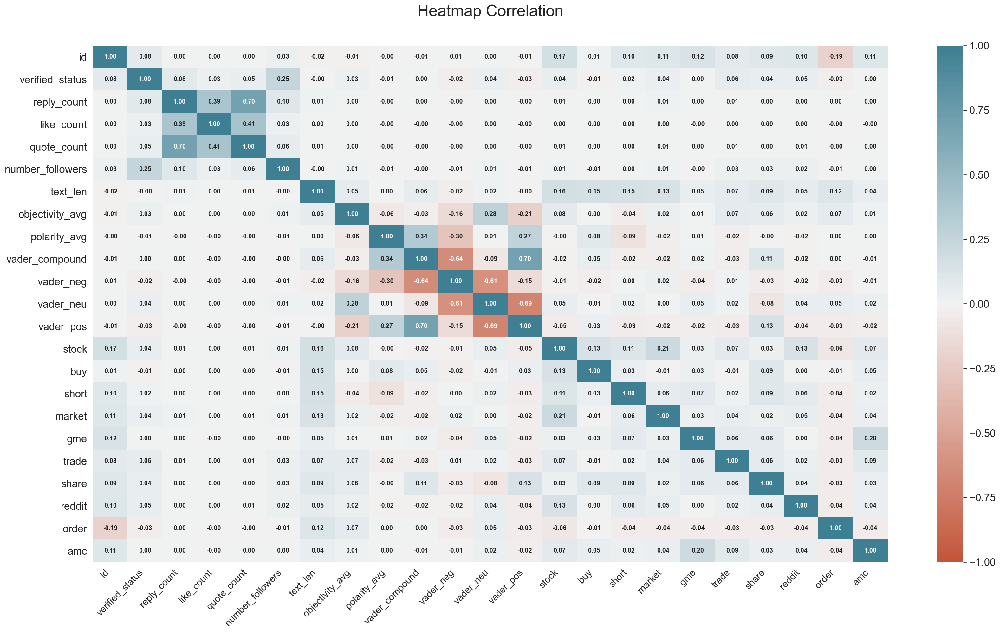

In [89]:
#seaborn heatmap to help around the correlation matrix
fig_heat = plt.figure(figsize=(25, 15))
ax = fig_heat.gca()
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df_eda.corr(), annot=True, vmin = -1,  fmt='.2f',
            vmax = 1, annot_kws = {'fontweight': 'bold'}, cmap=sns.diverging_palette(20, 220, n=200))
ax.set_title('Heatmap Correlation', fontsize=25, y = 1.05)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=15,)
plt.show()
fig_heat.savefig('Heatmap Twitter.png', bbox_inches='tight')

# 4.5 Twitter vs Stock Price

### 4.5.1 Correlation Matrix

To compare stock price with twittes, a new dataframe will be created based on the numerical data. To be easy to compare, the data will be resampled by day. Two dataframes will be created, one for plotting and another to check the correlation between the heatmap.

In [90]:
#select the numerical data from the twittes dataset(unscaled df)
df1 = df_eda.resample('D').mean()

#select the numerical data from the twittes dataset(scaled df)
df1_scl = df_eda_scl.resample('D').mean()


In [91]:
#create a column just for the count of numbers of tweets
df = pd.DataFrame(df_eda['verified_status'].resample('D').count())


In [92]:
#add the number of tweets to the dataframe(unscaled df)
df1['number_tweets'] = df

#add the number of tweets to the dataframe(scaled df)
df1_scl['number_tweets'] = scaler.fit_transform(df)


In [93]:
#add the number of tweets to the dataframe(unscaled df)
df1.index = pd.to_datetime(df1.index, format = '%m/%d/%Y').strftime('%Y-%m-%d')

#create an index for df1 with the format m/d/Y(scaled df)
df1_scl.index = pd.to_datetime(df1_scl.index, format = '%m/%d/%Y').strftime('%Y-%m-%d')


In [103]:
#select the data from the stock price(unscaled df)
df2 = df_GME_price[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']].resample('D').mean()

#select the data from the stock price (scaled df)
df2_scl = df_GME_scl[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']].resample('D').mean()


In [104]:
#fill the new values with forward fill (unscaled df)
df2.ffill(inplace = True)

#fill the new values with forward fill (scaled df)
df2_scl.ffill(inplace = True)


In [105]:
#create a new variable that specifies if the price went up or dow 0 for down and 1 for up
up_down = []
for i in range(df2_scl.shape[0]):
    if df2['Open'][i] > df2_scl['Close'][i]:
        up_down.append(0)
    else:
        up_down.append(1)
df2['up_down'] = up_down


In [106]:
#create a new variable that specifies if the price went up or dow 0 for down and 1 for up
up_down = []
for i in range(df2_scl.shape[0]):
    if df2_scl['Open'][i] > df2_scl['Close'][i]:
        up_down.append(0)
    else:
        up_down.append(1)
df2_scl['up_down'] = up_down


In [107]:
#create an index for df2 with the format m/d/Y(unscaled df)
df2.index = pd.to_datetime(df2_scl.index, format = '%m/%d/%Y').strftime('%Y-%m-%d')

#create an index for df2 with the format m/d/Y(scaled df)
df2_scl.index = pd.to_datetime(df2_scl.index, format = '%m/%d/%Y').strftime('%Y-%m-%d')


In [108]:
#concatenate the two dataframes (unscaled df)
df3 = pd.concat([df1_scl, df2_scl], axis = 1)

#concatenate the two dataframes(scaled df)
df3_scl = pd.concat([df1_scl, df2_scl], axis = 1)


In [109]:
#save the dataframes


In [110]:
df3_scl.head(2)


,verified_status,reply_count,like_count,quote_count,number_followers,text_len,objectivity_avg,polarity_avg,vader_compound,vader_neg,...,order,amc,number_tweets,Open,High,Low,Close,Adj Close,Volume,up_down
2020-09-01,-0.154117,-0.007599,-0.005296,-0.012002,-0.047777,0.085012,0.032318,-0.019962,-0.016544,0.002995,...,0.181768,-0.212626,-0.269147,-0.640851,-0.633120,-0.650223,-0.642535,-0.642535,-0.050901,0
2020-09-02,-0.173650,-0.017794,-0.009513,-0.013982,-0.048907,0.166716,-0.019592,0.083266,0.068253,0.017436,...,0.164736,-0.189799,-0.279317,-0.637965,-0.631124,-0.647174,-0.640516,-0.640516,-0.289669,0


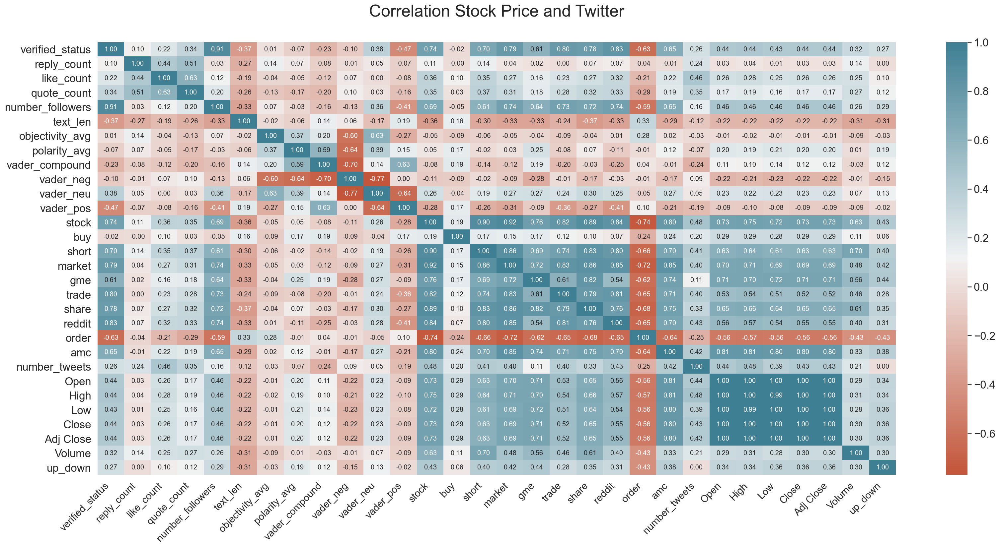

In [111]:
#seaborn heatmap to help around the correlation matrix
fig_heat = plt.figure(figsize=(24, 12))
ax = fig_heat.gca()
sns.heatmap(df3.corr(), annot=True, fmt='.2f', cmap=sns.diverging_palette(20, 220, n=200))
ax.set_title('Correlation Stock Price and Twitter', fontsize=25, y = 1.05)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=15,)
plt.show()
fig_heat.savefig('Correlation Stock Price and Twitter.png', bbox_inches='tight')

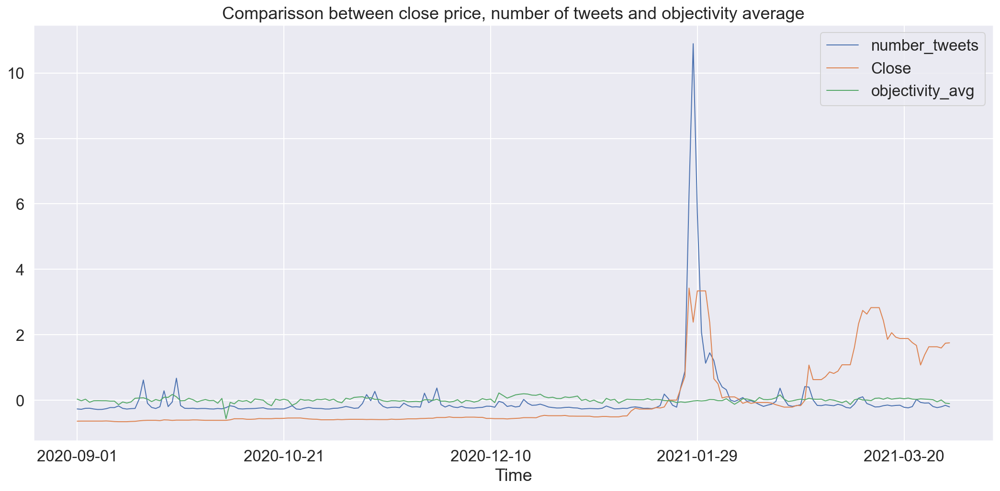

In [112]:
fig, ax = plt.subplots(figsize = (16, 8))
df3_scl[['number_tweets', 'Close', 'objectivity_avg']].plot(ax = ax, linewidth = 1)

# Set Title & Show the Image
ax.set_title('Comparisson between close price, number of tweets and objectivity average')
ax.set_xlabel('Time')
ax.legend()
plt.show();


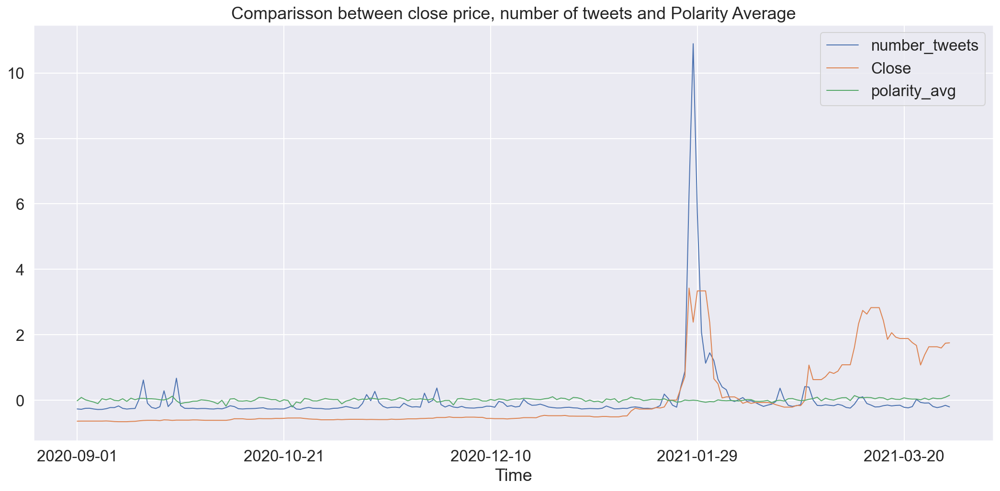

In [113]:
fig, ax = plt.subplots(figsize = (16, 8))
df3_scl[['number_tweets', 'Close', 'polarity_avg']].plot(ax = ax, linewidth = 1)
# Set Title & Show the Image
ax.set_title('Comparisson between close price, number of tweets and Polarity Average')
ax.set_xlabel('Time')
ax.legend()
plt.show();
fig.savefig('Correlation Stock Price and Twitter.png', bbox_inches='tight')

In [114]:
df3.columns

Index(['verified_status', 'reply_count', 'like_count', 'quote_count',
       'number_followers', 'text_len', 'objectivity_avg', 'polarity_avg',
       'vader_compound', 'vader_neg', 'vader_neu', 'vader_pos', 'stock', 'buy',
       'short', 'market', 'gme', 'trade', 'share', 'reddit', 'order', 'amc',
       'number_tweets', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'up_down'],
      dtype='object')

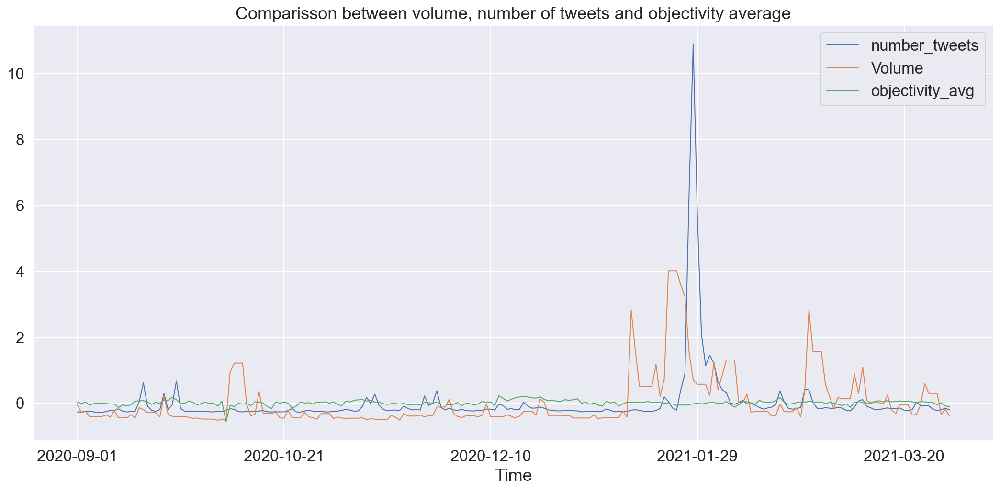

In [115]:
fig, ax = plt.subplots(figsize = (16, 8))
df3_scl[['number_tweets', 'Volume', 'objectivity_avg']].plot(ax = ax, linewidth = 1)

# Set Title & Show the Image
ax.set_title('Comparisson between volume, number of tweets and objectivity average')
ax.set_xlabel('Time')
ax.legend()
plt.show();


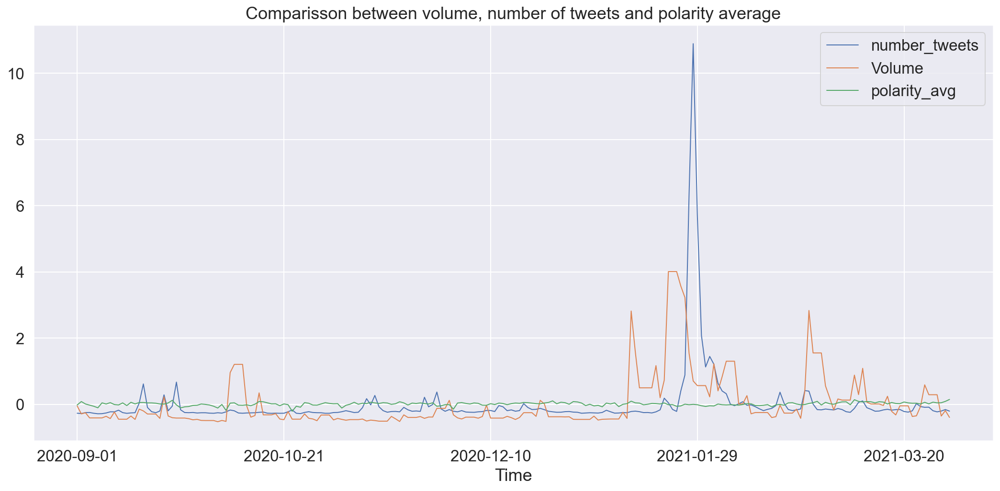

In [116]:
fig, ax = plt.subplots(figsize = (16, 8))
df3_scl[['number_tweets', 'Volume', 'polarity_avg']].plot(ax = ax, linewidth = 1)

# Set Title & Show the Image
ax.set_title('Comparisson between volume, number of tweets and polarity average')
ax.set_xlabel('Time')
ax.legend()
plt.show();


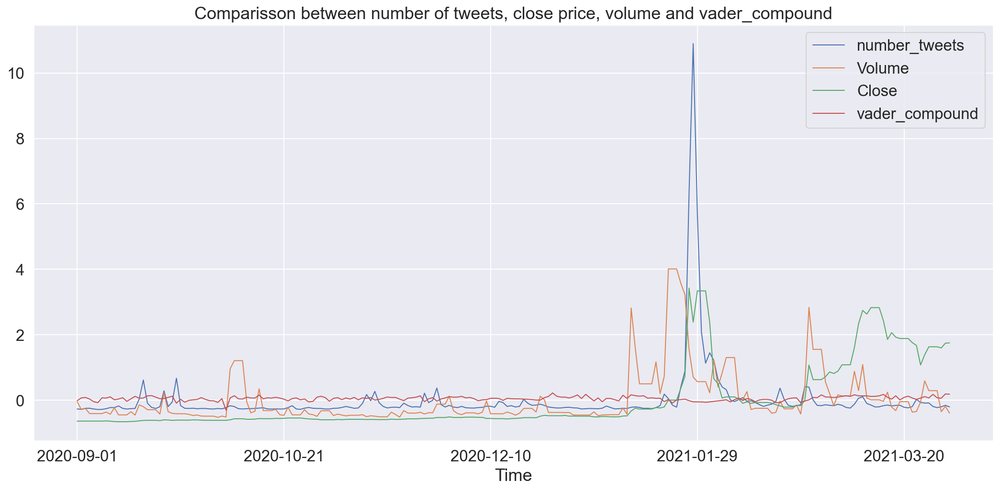

In [117]:
fig, ax = plt.subplots(figsize = (16, 8))
df3_scl[['number_tweets', 'Volume', 'Close', 'vader_compound']].plot(ax = ax, linewidth = 1)
# Set Title & Show the Image
ax.set_title('Comparisson between number of tweets, close price, volume and vader_compound')
ax.set_xlabel('Time')
ax.legend()
plt.show();
fig.savefig('Comparisson between number of tweets, close price, volume and vader_compound.png', bbox_inches='tight')

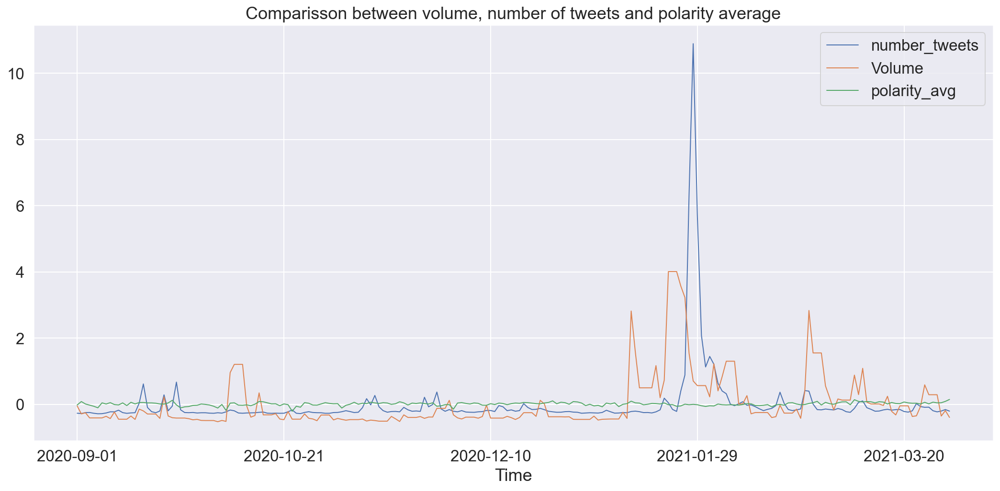

In [118]:
fig, ax = plt.subplots(figsize = (16, 8))
df3_scl[['number_tweets', 'Volume', 'polarity_avg']].plot(ax = ax, linewidth = 1)

# Set Title & Show the Image
ax.set_title('Comparisson between volume, number of tweets and polarity average')
ax.set_xlabel('Time')
ax.legend()
plt.show();

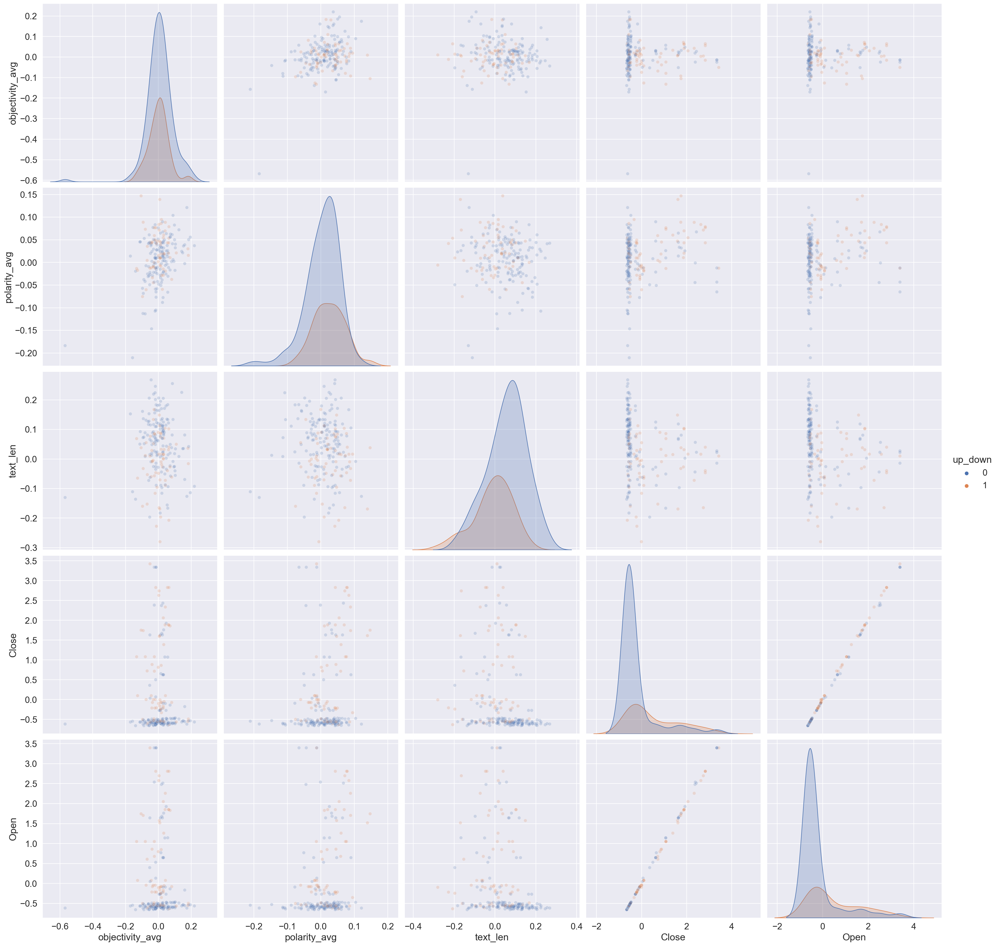

In [119]:
sns.pairplot(df3, vars=['objectivity_avg', 'polarity_avg', 'text_len', 'Close', 'Open'], hue='up_down', 
             plot_kws={'alpha': 0.2}, height=5)
plt.show();

### 4.5.2 Granger Causality test
Granger causality test is used to detemine if one time series will be useful to forecast another. In this case we want to know if the tweetes post will have influence on the stock price. 
Two different cases will be checked:

Case 1:
 * H0 : Number of Tweets will not cause change of the Volume of the stock transactioned;
 * H1 : Number of Tweets will cause change of the volume of the stock transactioned;

Case 2:
 * H0 : Number of Tweets will not cause change of the Stock Price;
 * H1 : Number of Tweets will cause change of the Stock Price;
  

In [120]:
data = df3[["number_tweets", "Volume"]].pct_change().dropna()
grangercausalitytests(data, 8, addconst = True, verbose = True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1652  , p=0.6848  , df_denom=207, df_num=1
ssr based chi2 test:   chi2=0.1676  , p=0.6822  , df=1
likelihood ratio test: chi2=0.1676  , p=0.6823  , df=1
parameter F test:         F=0.1652  , p=0.6848  , df_denom=207, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1962  , p=0.8220  , df_denom=204, df_num=2
ssr based chi2 test:   chi2=0.4020  , p=0.8179  , df=2
likelihood ratio test: chi2=0.4016  , p=0.8181  , df=2
parameter F test:         F=0.1962  , p=0.8220  , df_denom=204, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1380  , p=0.9372  , df_denom=201, df_num=3
ssr based chi2 test:   chi2=0.4284  , p=0.9343  , df=3
likelihood ratio test: chi2=0.4279  , p=0.9344  , df=3
parameter F test:         F=0.1380  , p=0.9372  , df_denom=201, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1064  , p=0.9802  

{1: ({'ssr_ftest': (0.16522721490294753, 0.684808776401479, 207.0, 1),
   'ssr_chi2test': (0.16762181222038158, 0.6822340851231374, 1),
   'lrtest': (0.167554950007343, 0.6822940059100033, 1),
   'params_ftest': (0.1652272149029501, 0.684808776401479, 207.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.19617834793288894, 0.8220205100050297, 204.0, 2),
   'ssr_chi2test': (0.4019732815487626, 0.8179233583035552, 2),
   'lrtest': (0.4015872154375302, 0.8180812597882812, 2),
   'params_ftest': (0.19617834793291655, 0.8220205100050111, 204.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (0.137986568235709, 0.937218501896199, 201.0, 3),
   'ssr_chi2test': (0.428376211836231, 0.9343202234931581, 3),
   'lrtest': (0.42793569593891334, 0.9344130559305541, 3),
   'params_ftest': (0.13798656823570662, 0.9372185018962084, 201.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0., 

In the first case, all the p values are superior to 0.5, so in this case, we fail to reject the null hypothesis. So the number of tweets don't affect the volume of the stock transactions.

In [121]:
data = df3[["number_tweets", "Close"]].pct_change().dropna()
grangercausalitytests(data, 8, addconst = True, verbose = True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0788  , p=0.7793  , df_denom=207, df_num=1
ssr based chi2 test:   chi2=0.0799  , p=0.7774  , df=1
likelihood ratio test: chi2=0.0799  , p=0.7775  , df=1
parameter F test:         F=0.0788  , p=0.7793  , df_denom=207, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0205  , p=0.0510  , df_denom=204, df_num=2
ssr based chi2 test:   chi2=6.1890  , p=0.0453  , df=2
likelihood ratio test: chi2=6.0991  , p=0.0474  , df=2
parameter F test:         F=3.0205  , p=0.0510  , df_denom=204, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.9837  , p=0.1176  , df_denom=201, df_num=3
ssr based chi2 test:   chi2=6.1585  , p=0.1041  , df=3
likelihood ratio test: chi2=6.0691  , p=0.1083  , df=3
parameter F test:         F=1.9837  , p=0.1176  , df_denom=201, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4575  , p=0.2166  

{1: ({'ssr_ftest': (0.07875272348338941, 0.7792751250811085, 207.0, 1),
   'ssr_chi2test': (0.07989406730198925, 0.7774410188012996, 1),
   'lrtest': (0.0798788733886795, 0.777461624909095, 1),
   'params_ftest': (0.07875272348341832, 0.7792751250810771, 207.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (3.0204624697739253, 0.05096558631289578, 204.0, 2),
   'ssr_chi2test': (6.1889868253210825, 0.04529795401882203, 2),
   'lrtest': (6.099121297158263, 0.04737973617337125, 2),
   'params_ftest': (3.0204624697739444, 0.050965586312895106, 204.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (1.9837494645822464, 0.11762890626913364, 201.0, 3),
   'ssr_chi2test': (6.158505800494138, 0.10414813441093676, 3),
   'lrtest': (6.0690952321428995, 0.10829655714990859, 3),
   'params_ftest': (1.983749464582251, 0.11762890626913279, 201.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 

For case 2, all the p values for lag 2 is inferior to 0.5, so in this case, we reject the null hypothesis. So the number of tweets affect the price of the stock transactions.

In [122]:
#save the new dataframe into a csv file
df_eda.to_csv("df_eda_part1.csv", index = True)

In [123]:
#save the new dataframe into a csv file
df3.to_csv("df3_part1.csv", index = True)